<div>
<img src="https://drive.google.com/uc?export=view&id=1vK33e_EqaHgBHcbRV_m38hx6IkG0blK_" width="350"/>
</div>

# Artificial Intelligence - MSc

## ED5005 - Project and Dissertation SEM 2023_4

### Title: "The AI Augmented Underwriter - Integrating unsupervised learning for an understandable approach to predictive insurance underwriting."

* "Integrating unsupervised learning techniques for an interpretable, explainable approach to predictive insurance underwriting."
* "Integrating unsupervised and supervised learning with human-in-the-loop to increase interpretability and explainability in predictive underwriting"
* "Integrating unsupervised and supervised learning with human-in-the-loop as an explainable approach to augmented underwriting in Life Insurance"
* "Integrating Unsupervised Learning and Human-in-the-Loop for Explainable Predictive Modelling in Life Insurance Underwriting"

***
### Supervisor: Martin Cunneen
### Student Name: Paul Trayers</span>
### Student ID: 8907021</span>
### Date of Final Submission: Aug 4th 2024</span>

<br><br>
Copyright (C) 2024 - All rights reserved, do not copy or distribute without permission of the author.

***

# Introduction

This project accompanies ED5005 Dissertation using the Prudential Insurance dataset (Montoya et al., 2015). Based on the Methodology section of the  dissertation we begin with an EDA following that described by (Sarpal, 2022). We then move on to peform a series of supervised learning techniques on the Prudential dataset also outlined by (Sarpal, 2022) recording these results as a baseline. Then, we move on to performing a series of unsupervised techniques which focus on dimension reduction and finally clustering techniques and compare results with the baseline, with the intention ultimately of achieving  comparable results with unsupervised methods.





# 1. Exploratory Data Analysis (EDA)

## 1.1 Import Libraries

In [ ]:
# Import modules

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 1.2 Import Dataset

In [ ]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive/', force_remount=True)

# Load dataframe from csv
df = pd.read_csv('/content/drive/My Drive/ED5005_Project/data/train.csv')

# Display key attributes of dataframe.
print(df.dtypes.to_string())
df.describe()


Mounted at /content/drive/
Id                       int64
Product_Info_1           int64
Product_Info_2          object
Product_Info_3           int64
Product_Info_4         float64
Product_Info_5           int64
Product_Info_6           int64
Product_Info_7           int64
Ins_Age                float64
Ht                     float64
Wt                     float64
BMI                    float64
Employment_Info_1      float64
Employment_Info_2        int64
Employment_Info_3        int64
Employment_Info_4      float64
Employment_Info_5        int64
Employment_Info_6      float64
InsuredInfo_1            int64
InsuredInfo_2            int64
InsuredInfo_3            int64
InsuredInfo_4            int64
InsuredInfo_5            int64
InsuredInfo_6            int64
InsuredInfo_7            int64
Insurance_History_1      int64
Insurance_History_2      int64
Insurance_History_3      int64
Insurance_History_4      int64
Insurance_History_5    float64
Insurance_History_7      int64
Insurance_Hi

,Id,Product_Info_1,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,...,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Response
count,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,...,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000
mean,39507.211515,1.026355,24.415655,0.328952,2.006955,2.673599,1.043583,0.405567,0.707283,0.292587,...,0.056954,0.010054,0.045536,0.010710,0.007528,0.013691,0.008488,0.019905,0.054496,5.636837
std,22815.883089,0.160191,5.072885,0.282562,0.083107,0.739103,0.291949,0.197190,0.074239,0.089037,...,0.231757,0.099764,0.208479,0.102937,0.086436,0.116207,0.091737,0.139676,0.226995,2.456833
min,2.000000,1.000000,1.000000,0.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,19780.000000,1.000000,26.000000,0.076923,2.000000,3.000000,1.000000,0.238806,0.654545,0.225941,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
50%,39487.000000,1.000000,26.000000,0.230769,2.000000,3.000000,1.000000,0.402985,0.709091,0.288703,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
75%,59211.000000,1.000000,26.000000,0.487179,2.000000,3.000000,1.000000,0.567164,0.763636,0.345188,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000
max,79146.000000,2.000000,38.000000,1.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000


From the cell above, the dataframe contains different datatypes. Any with `object` dtype contain non-numeric (character) data and must be pre-processed to make machine-interpretable.

In [ ]:
# set 'Id' as the datadrame index
df_index_set = df.set_index('Id')

In [ ]:
df_index_set.head()

,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,...,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Response
Id,,,,,,,,,,,,,,,,,,,,,
2,1,D3,10,0.076923,2,1,1,0.641791,0.581818,0.148536,...,0,0,0,0,0,0,0,0,0,8
5,1,A1,26,0.076923,2,3,1,0.059701,0.600000,0.131799,...,0,0,0,0,0,0,0,0,0,4
6,1,E1,26,0.076923,2,3,1,0.029851,0.745455,0.288703,...,0,0,0,0,0,0,0,0,0,8
7,1,D4,10,0.487179,2,3,1,0.164179,0.672727,0.205021,...,0,0,0,0,0,0,0,0,0,8
8,1,D2,26,0.230769,2,3,1,0.417910,0.654545,0.234310,...,0,0,0,0,0,0,0,0,0,8


The values of each column (risk feature) for the first five life insurance applicants in the dataset are listed in each row, with the Id serving as the index in this case.

As can be observed above, there is a combination of normalized and non-normalized numeric-valued features. Before we train and test our models further, we must examine and, if necessary, pre-process each of these columns.



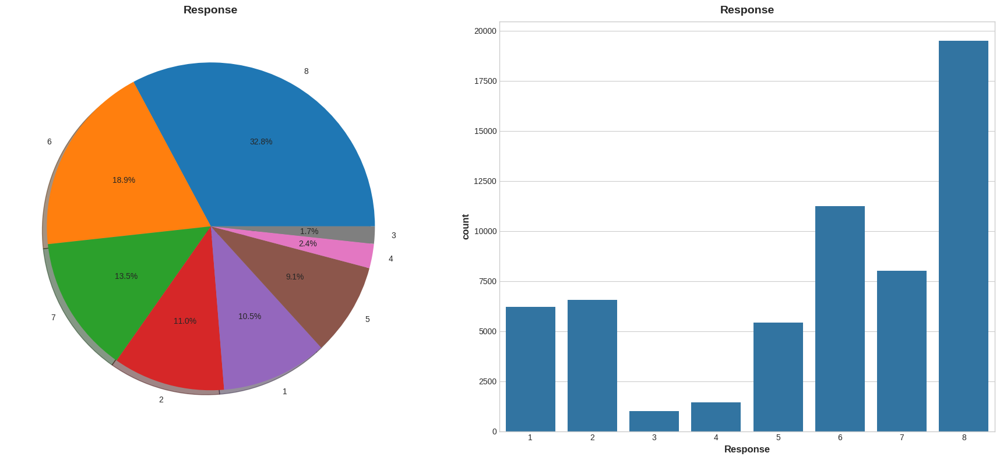

In [ ]:
df, ax = plt.subplots(1, 2, figsize=(18, 8))

# Pie chart
df_index_set['Response'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0], shadow=True)
ax[0].set_title('Response')
ax[0].set_ylabel('')

# Bar chart
sns.countplot(x='Response', data=df_index_set, ax=ax[1])
ax[1].set_title('Response')

plt.show()

The histogram displays the distribution of applicants across the entire dataset based on their risk ratings (Response).

The distribution is "unbalanced" being skewed towards classes 6–8, which is significant, even though classes 1-2 also make up a sizeable portion of the dataset. Later, we will assess how well our ML models are able to "mimic" this distribution, as an indicator of whether they have been adequately fitted.


## 1.3 Distributions

In [ ]:
# Separate dataset columns.

ColSet1_ProdInfo = ['Product_Info_1','Product_Info_2','Product_Info_3','Product_Info_4','Product_Info_5','Product_Info_6','Product_Info_7']
ColSet2_ApplicantInfo = ['Ins_Age','Ht','Wt','BMI']
ColSet3_EmploymentInfo = ['Employment_Info_1','Employment_Info_2','Employment_Info_3','Employment_Info_4','Employment_Info_5','Employment_Info_6']
ColSet4_InsuredInfo = ['InsuredInfo_1','InsuredInfo_2','InsuredInfo_3','InsuredInfo_4','InsuredInfo_5','InsuredInfo_6','InsuredInfo_7']
ColSet5_InsuranceHistoryInfo = ['Insurance_History_1','Insurance_History_2','Insurance_History_3','Insurance_History_4','Insurance_History_5','Insurance_History_7','Insurance_History_8','Insurance_History_9']
ColSet6_FamilyHistoryInfo = ['Family_Hist_1','Family_Hist_2','Family_Hist_3','Family_Hist_4','Family_Hist_5']

ColSet7_MedicalHistoryInfo = ['Medical_History_1','Medical_History_2','Medical_History_3','Medical_History_4','Medical_History_5','Medical_History_6','Medical_History_7','Medical_History_8',
                              'Medical_History_9','Medical_History_10','Medical_History_11','Medical_History_12','Medical_History_13','Medical_History_14','Medical_History_15',
                              'Medical_History_16','Medical_History_17','Medical_History_18','Medical_History_19','Medical_History_20','Medical_History_21','Medical_History_22',
                              'Medical_History_23','Medical_History_24','Medical_History_25','Medical_History_26','Medical_History_27','Medical_History_28','Medical_History_29',
                              'Medical_History_30','Medical_History_31','Medical_History_32','Medical_History_33','Medical_History_34','Medical_History_35','Medical_History_36',
                              'Medical_History_37','Medical_History_38','Medical_History_39','Medical_History_40','Medical_History_41']

ColSet8_MedicalKeywordInfo = ['Medical_Keyword_1','Medical_Keyword_2','Medical_Keyword_3','Medical_Keyword_4','Medical_Keyword_5','Medical_Keyword_6','Medical_Keyword_7','Medical_Keyword_8',
                              'Medical_Keyword_9','Medical_Keyword_10','Medical_Keyword_11','Medical_Keyword_12','Medical_Keyword_13','Medical_Keyword_14','Medical_Keyword_15','Medical_Keyword_16',
                              'Medical_Keyword_17','Medical_Keyword_18','Medical_Keyword_19','Medical_Keyword_20','Medical_Keyword_21','Medical_Keyword_22','Medical_Keyword_23','Medical_Keyword_24',
                              'Medical_Keyword_25','Medical_Keyword_26','Medical_Keyword_27','Medical_Keyword_28','Medical_Keyword_29','Medical_Keyword_30','Medical_Keyword_31','Medical_Keyword_32',
                              'Medical_Keyword_33','Medical_Keyword_34','Medical_Keyword_35','Medical_Keyword_36','Medical_Keyword_37','Medical_Keyword_38','Medical_Keyword_39','Medical_Keyword_40',
                              'Medical_Keyword_41','Medical_Keyword_42','Medical_Keyword_43','Medical_Keyword_44','Medical_Keyword_45','Medical_Keyword_46','Medical_Keyword_47','Medical_Keyword_48']

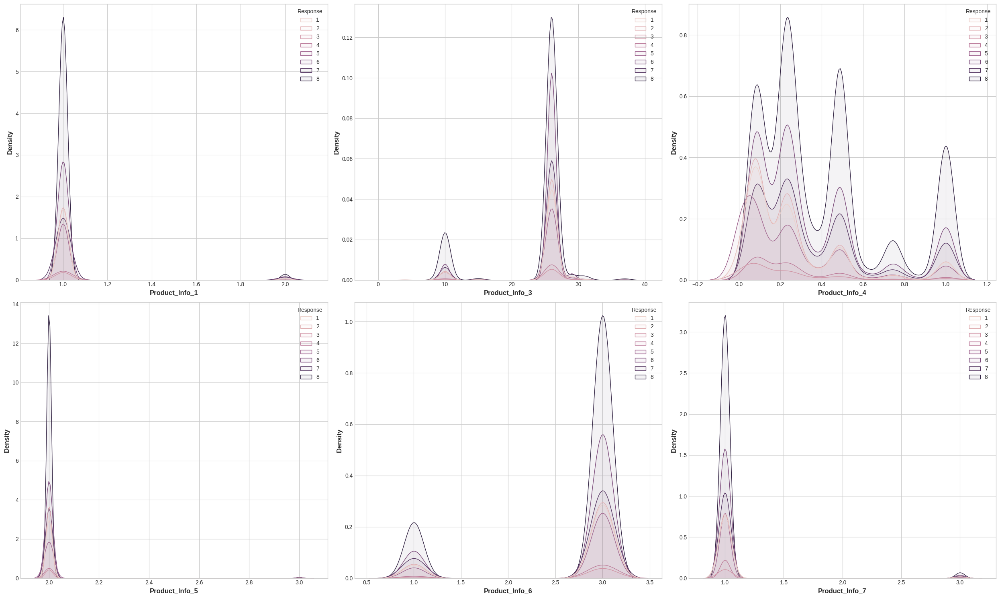

In [ ]:
# Create grid and subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,15))

# Exclude Product_Info_2 as not encoded as numeric yet.
ColSet1_ProdInfo_kde = ['Product_Info_1','Product_Info_3','Product_Info_4','Product_Info_5','Product_Info_6','Product_Info_7']

# Create kernel density estimate (KDE) plot for column in the set.
for i, column in enumerate(df_index_set[ColSet1_ProdInfo_kde].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])


**Product Information**

The KDE plots show distributions of Response group/cohort of applicants across various `Product_Info` variables which we can observe have varying modalities. However, they all appear to have a high degree of overlap across the `Response` variable with no major difference in relative densities. Therefore the variations existing between the features do nor particularly help in predicting applicant risk rating.


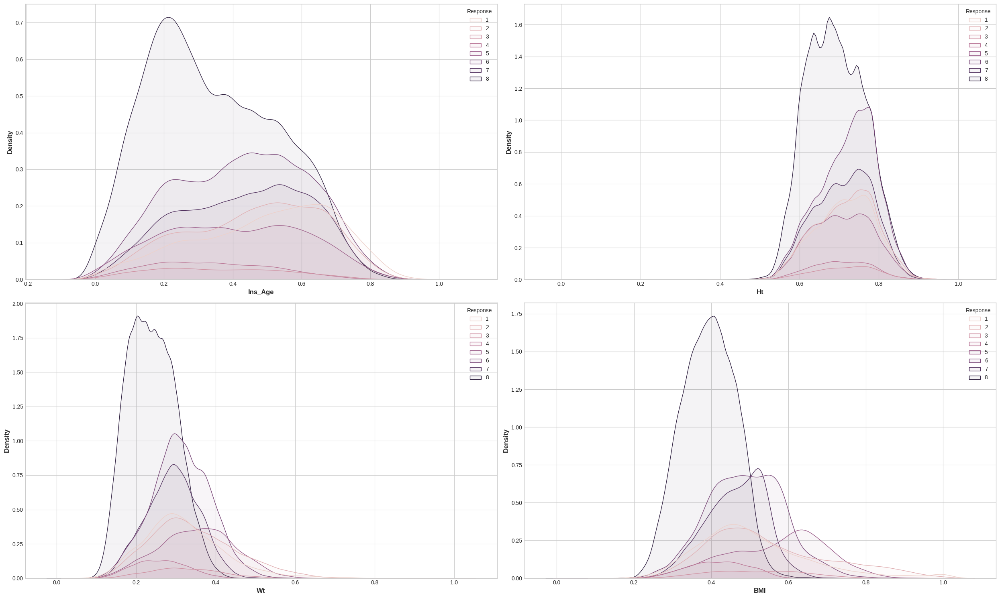

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25,15))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet2_ApplicantInfo].columns):
    plot = sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//2,i%2])

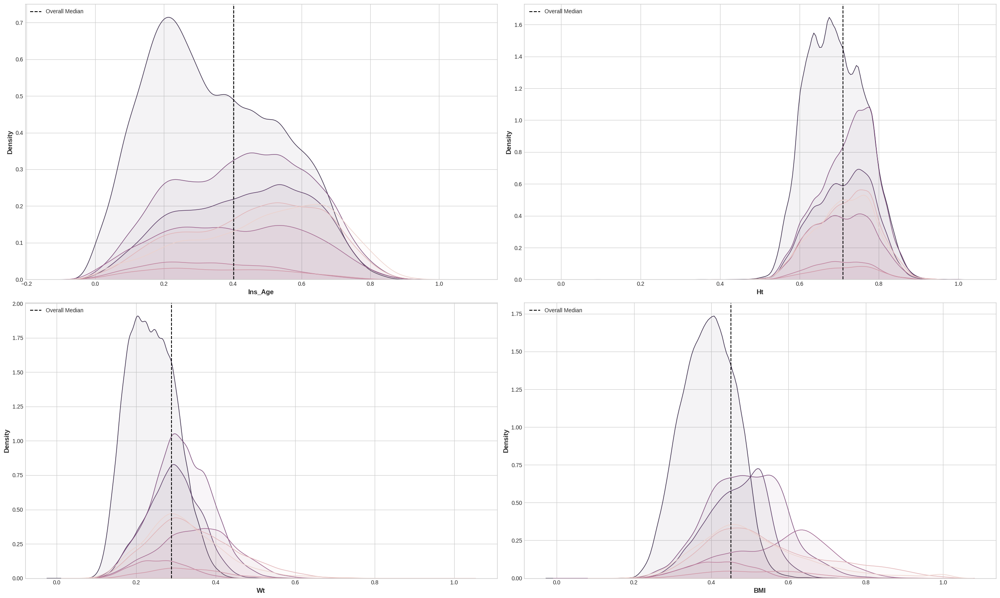

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25,15))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet2_ApplicantInfo].columns):
    plot = sns.kdeplot(data=df_index_set,
                       x=column,
                       hue="Response", fill=True, common_norm=True, alpha=0.05,
                       ax=axes[i//2,i%2])

    # Calculate the overall median for the column
    overall_median = df_index_set[column].median()

    # Add a vertical line for the overall median
    plot.axvline(overall_median, color='black', linestyle='--', label=f"Overall Median")

    # Add legend for the medians AND the response categories
    plot.legend(loc='upper left')

**Biophysicial Information**

**Ins_Age:** This KDE plot highlights significant variation in the distribution across different Response groups, with each group showing distinct patterns in terms of peak broadening and shouldering. While the majority of the density is spread between x=0 and x=0.9, the shapes and skews of the distributions differ notably among cohorts. For instance, Response category 8 shows a positive skew towards x=0.2, whereas most other categories exhibit negative skews towards x=0.4. Lower Response categories (1 to 4) tend to have broader, more uniform distributions, while higher categories (5 to 8) feature sharper peaks and more pronounced skews. This indicates that as the Response category increases, the age distribution becomes more concentrated around specific ranges.
The main demographic insight is that younger individuals (closer to x=0.2) are more prevalent in higher Response categories, whereas a wider age range is seen in lower Response categories.

**Ht:** This KDE plot highlights significant variation in the 'Ht' distribution across different Response groups, with each group showing distinct patterns in terms of peak broadening and shouldering. The majority of the density is spread between x=0.6 and x=0.8, indicating that most individuals fall within this height range. Each cohort's skew mirrors that seen in the 'Ins_Age' distribution: Response category 8 displays a positive skew, while most other categories exhibit a negative skew. This pattern underscores the demographic insight that individuals in higher Response categories tend to have characteristics concentrated around certain ranges, while lower categories display a broader distribution.

**Wt:** This KDE plot illustrates significant variation in the `Wt` distribution across different Response groups, with distinct patterns of peak broadening and shouldering. Most of the distribution density lies between x=0.2 and x=0.5. Notably, the distribution for Response category 8 is concentrated around lower 'Wt' values (x=0.2), whereas the rest of the population is more broadly distributed across the 0.2 to 0.5 interval.

**BMI:** This KDE plot of BMI reveals significant variation in the composition and structure of each Response group distribution, with noticeable broadening and shouldering of the peaks. Similar to the 'Wt' distribution, the majority of the density is spread between x=0.4 and x=0.6. Response category 8 has a distinct peak centered at x=0.4, while most other categories are spread across the x=0.4 to x=0.6 range. Notably, one of the "medium" risk-rating distributions exhibits a pronounced negative skew towards x=0.6, differing from its peers that skew more towards x=0.5.

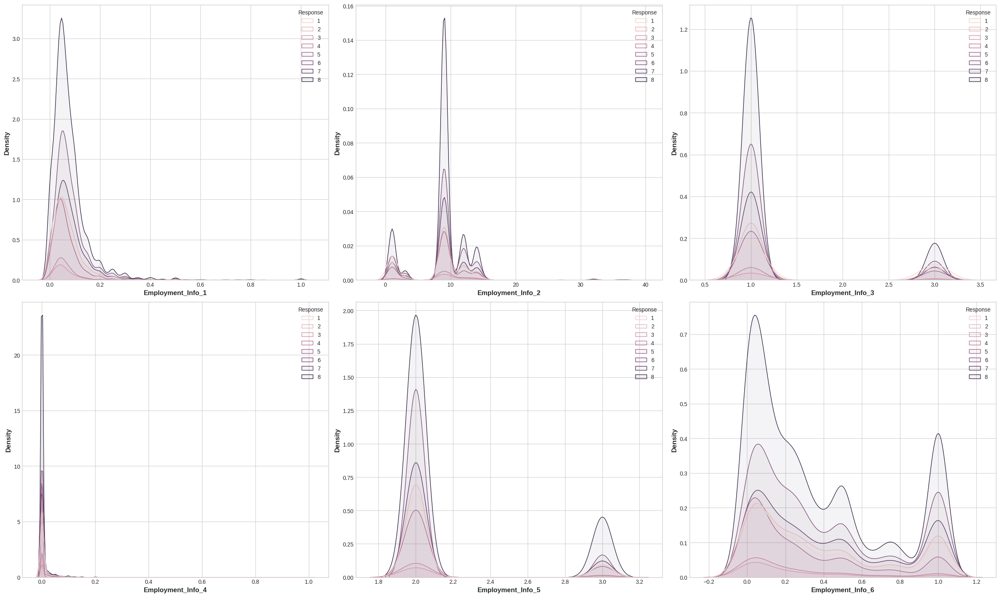

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,15))

# Create kernel density estimate (KDE) plot for column in the set.
for i, column in enumerate(df_index_set[ColSet3_EmploymentInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

**Employment Information**

These KDE plots display distributions of `Employment_Info` features with varying modalities, but a common trend is that they closely overlap between each Response group (cohort of applicants), showing no significant differences in relative densities. Therefore, variations in these features are unlikely to contribute individually to predicting an applicant's risk rating.

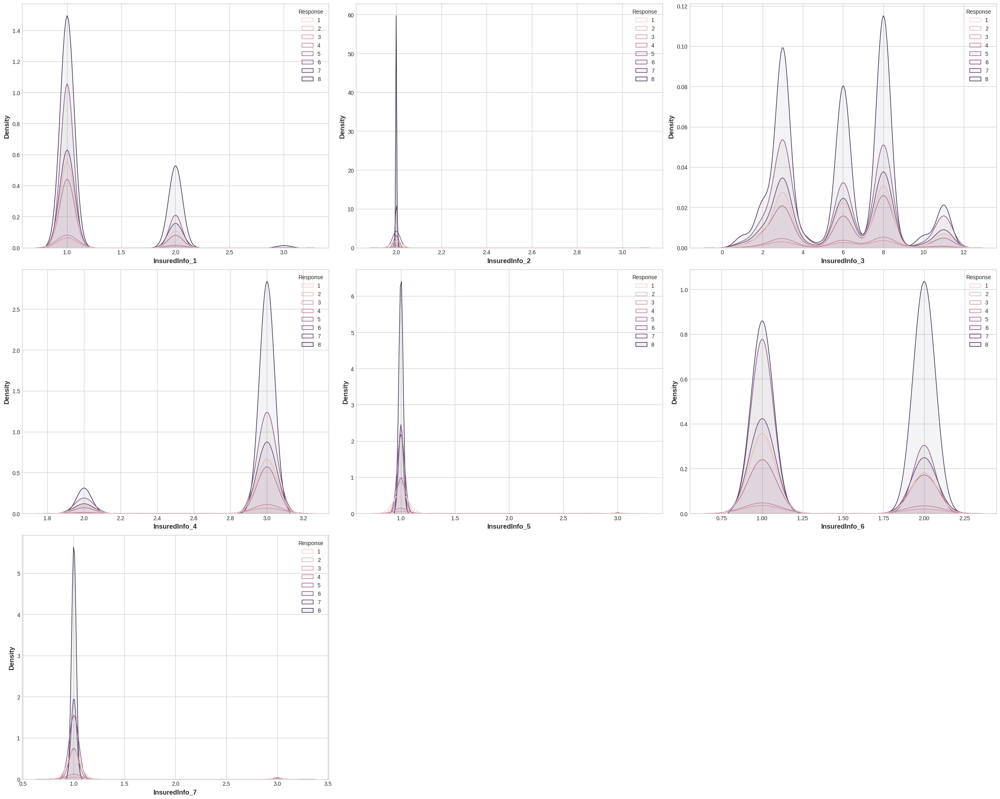

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(25,20))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet4_InsuredInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

# Delete unused axes
fig.delaxes(axes[2,1])
fig.delaxes(axes[2,2])

**Insured Information**

These KDE plots illustrate distributions of various `InsuredInfo` features with varying modalities; however, a consistent trend is that they all closely overlap across different Response groups/cohorts of applicants, with no significant differences in relative densities. Consequently, variations in these features are unlikely to individually aid in predicting an applicant's risk rating.

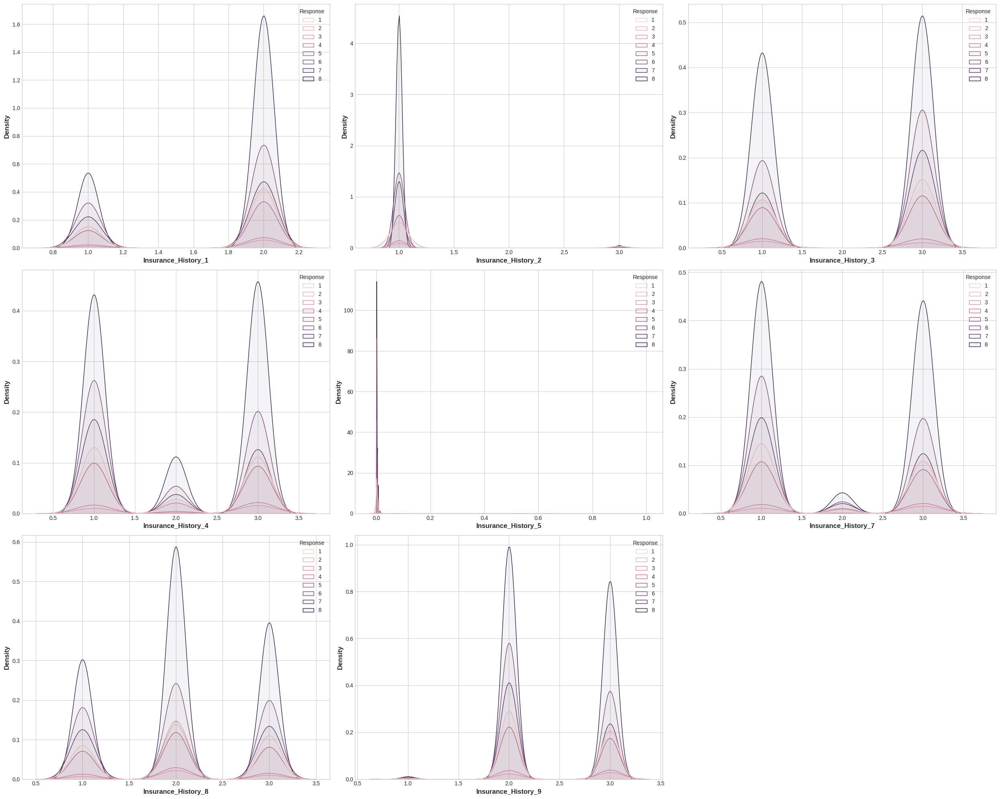

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(25,20))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet5_InsuranceHistoryInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

# Delete unused axes
fig.delaxes(axes[2,2])

**Insurance History Information**

These KDE plots display various distributions with differing modalities across `Insurance_History` variables. However, a consistent trend is that they all closely overlap across each Response group/cohort of applicants, showing no significant differences in relative densities. Therefore, variations in these features are unlikely to individually contribute to predicting an applicant's risk rating.

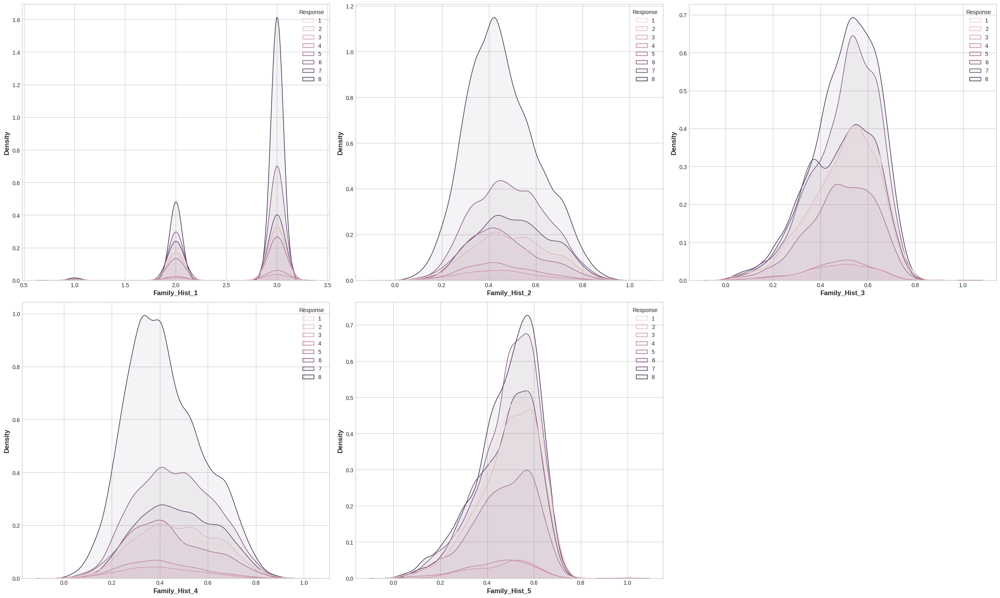

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,15))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet6_FamilyHistoryInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

# Delete unused axes
fig.delaxes(axes[1,2])


### Family History Information

#### Family_Hist_1:
This KDE plot shows a bimodal distribution with peaks at x=2 and x=3., along with a very low-density curve at x=1. The most prominent peak is at x=3. However, since this feature shows minimal variation in relative densities across the different Response classes, it is unlikely that variations in this feature will significantly contribute to predicting an applicant's risk rating.

#### Family_Hist_2 - Family_Hist_5:
These KDE plots display several unimodal distributions with some variation in the composition and structure of each Response group's distribution. Each peak demonstrates broadening and shouldering. While most of the distributions' densities are spread between x=0.2 and x=0.8, each cohort's distribution varies somewhat in shape and skewness/kurtosis. For example, class 8 generally features more positive kurtosis compared to most other classes, which tend to show broader density plots.

<ipython-input-124-420d907b1d1c>:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_index_set,


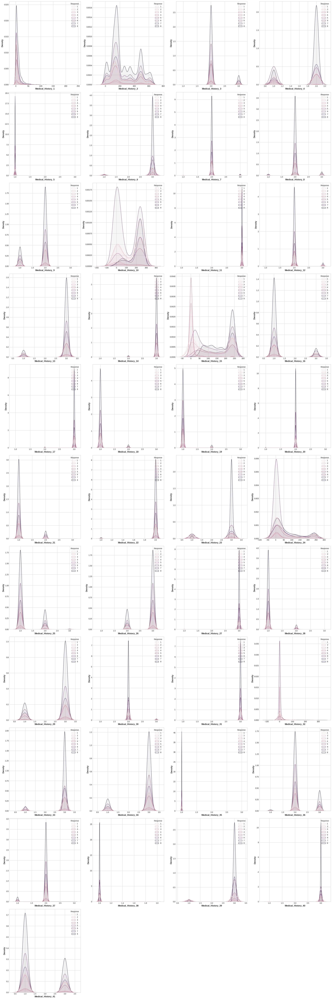

In [ ]:
# Create grid with subplots
fig, axes = plt.subplots(nrows=11, ncols=4, figsize=(25, 75))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet7_MedicalHistoryInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//4,i%4])

# Delete unused axes
fig.delaxes(axes[10,1])
fig.delaxes(axes[10,2])
fig.delaxes(axes[10,3])


### Medical History

Most of these KDE plots feature distributions that closely overlap across the different Response groups/cohorts of applicants. Therefore, variations in these underlying features are unlikely to individually provide predictive power for determining an applicant's risk rating. However, there are a few notable exceptions:

#### Medical_History_2/15/24:
These KDE plots show multimodal distributions with some degree of predictive distinction in terms of variance, as the peaks of each Response group distribution show different degrees of broadening and shouldering. However, it can be noted that the scales of the y-axes here, the densities for each underlying distribution, are very small, limiting the ability of these features to individually distinguish between Response groups.

#### Medical_History_10:
This KDE plot displays some interesting characteristics. For low-risk applicant cohorts, the distributions appear bimodal, whereas at higher risk levels, the distribution tends toward a single peak. However, as we later identify, this column has a very high proportion of missing values, therefore its distribution should not be misconstrued as highly predictive.

#### Medical_History_23:
This KDE plot indicates that this feature shows some potential. As the Response value/risk rating increases, each peak in the bimodal distribution becomes sharper, with a more positive kurtosis. In simpler terms, values further from the peaks' centers tend to correlate with a lower risk rating, whereas values that closely overlap with the peaks tend to represent applicants with higher risk ratings.

<ipython-input-125-b12719104e42>:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_index_set,


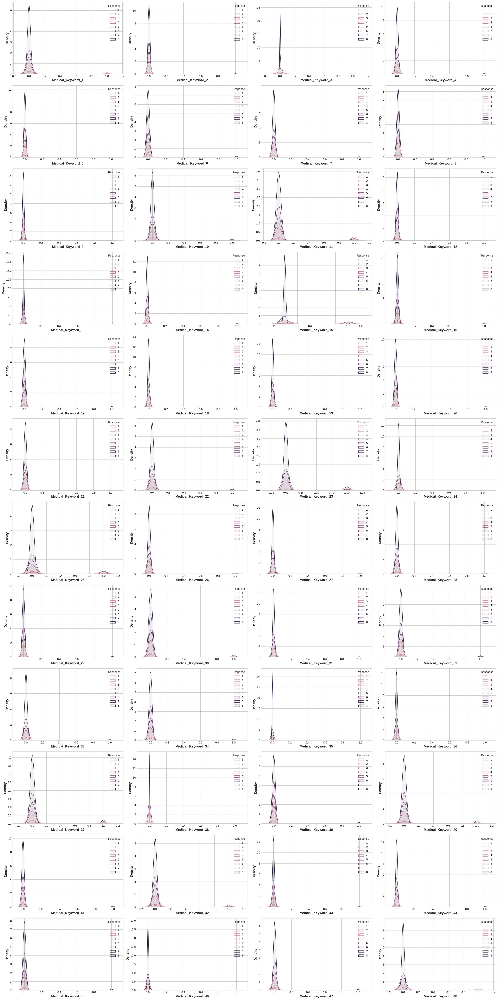

In [ ]:
# Set up a subplot grid with a reduced figure size.
fig, axes = plt.subplots(nrows=12, ncols=4, figsize=(25,50))

# Create KDE plot for columns in set.
for i, column in enumerate(df_index_set[ColSet8_MedicalKeywordInfo].columns):
    sns.kdeplot(data=df_index_set,
                x=column,
                hue="Response", fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//4, i%4])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


### Medical Keywords

These KDE plots display distributions with varying modalities, yet they consistently show a close overlap between each Response group/cohort of applicants, with no significant differences in relative densities. Therefore, variations in these features are unlikely to individually contribute to predicting an applicant's risk rating.

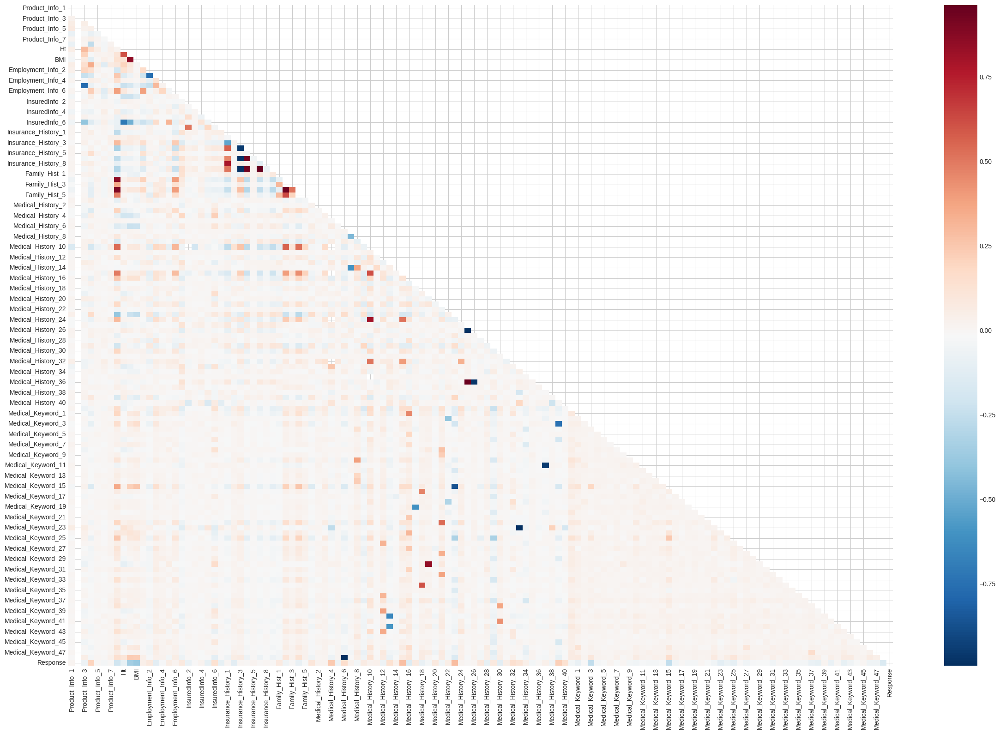

In [ ]:
# We know that at least columns in the Dataframe contain non-numeric data, preventing the correlation calculation...
# Convert relevant columns to numeric type if they contain numerical data represented as strings
for column in df_index_set.columns:
    if df_index_set[column].dtype == 'object':  # Check if the column is of object type (likely string)
        try:
            df_index_set[column] = pd.to_numeric(df_index_set[column], errors='coerce')  # Attempt conversion, replacing non-convertible values with NaN
        except:
            pass  # Skip columns that cannot be converted

# Generate correlation matrix and mask upper-right half
corrs = df_index_set.corr()
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True

# Convert correlation matrix to heatmap with Seaborn
plt.figure(figsize=(24,16))
sns.heatmap(corrs, cmap='RdBu_r', mask=mask)
plt.show()

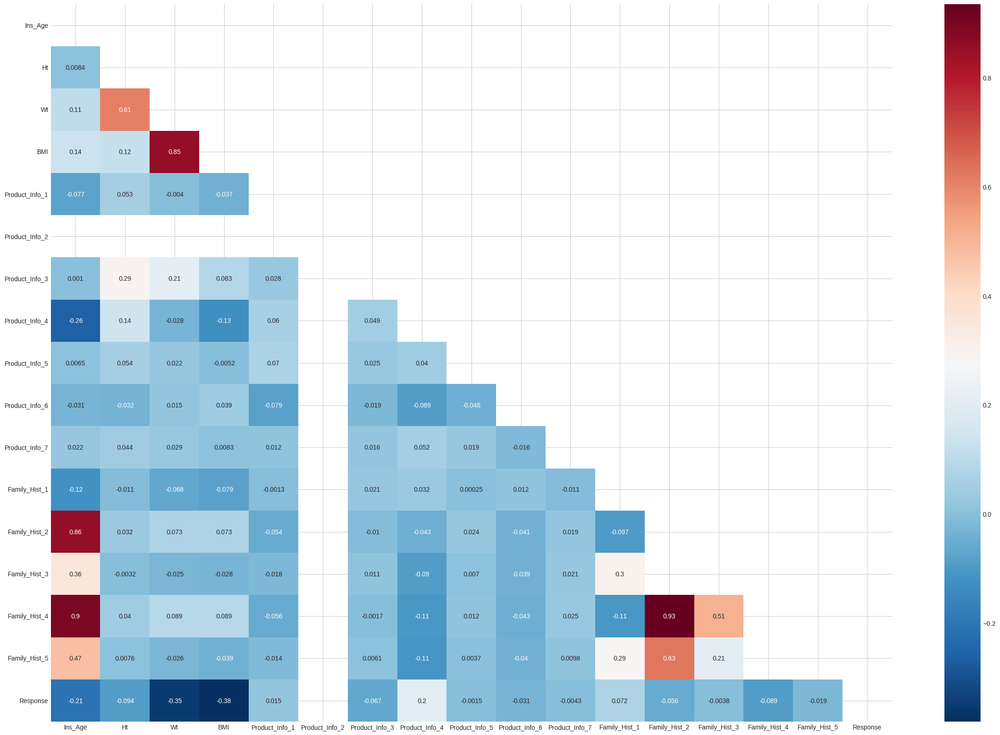

In [ ]:
# Assume df_index_set is your DataFrame

# Step 1: Specify the columns you want to include
columns_to_include = []  # Replace with your specific columns

# Add the predefined list to the columns_to_include list
columns_to_include.extend(ColSet2_ApplicantInfo)
columns_to_include.extend(ColSet1_ProdInfo)
columns_to_include.extend(ColSet6_FamilyHistoryInfo)
columns_to_include.append('Response')

# Step 2: Filter the DataFrame to include only the specified columns
df_filtered = df_index_set[columns_to_include]

# Step 3: Convert relevant columns to numeric type if they contain numerical data represented as strings
for column in df_filtered.columns:
    if df_filtered[column].dtype == 'object':  # Check if the column is of object type (likely string)
        try:
            df_filtered[column] = pd.to_numeric(df_filtered[column], errors='coerce')  # Attempt conversion, replacing non-convertible values with NaN
        except:
            pass  # Skip columns that cannot be converted

# Step 4: Produce a correlation matrix of the filtered dataset
corrs = df_filtered.corr()

# Create mask to hide upper-right half of the matrix
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True

# Convert correlation matrix to heatmap with Seaborn
plt.figure(figsize=(24, 16))
sns.heatmap(corrs, cmap='RdBu_r', mask=mask, annot=True)  # `annot=True` to show correlation values
plt.show()


Based on the chart above, we can infer the following for each column set:

### Column Set 1 - Product Info:
These features show minimal interaction or correlation with most other feature sets, except for `Employment_Info_1`, `Employment_Info_5`, and `Insured_Info_6`. These columns may be directly correlated because an applicant's employment or financial status can influence the type of policy or product they apply for.

### Column Set 2 - Applicant Info:
These columns exhibit varying interactions with other feature sets, with the strongest correlations (excluding those within the same column set) observed between some `Family_Hist` columns and `Insured_Info_6`.

### Column Set 3 - Employment Info:
Aside from two strong anti-correlations between `Employment_Info_2` and `Employment_Info_3`, and between `Employment_Info_5` and `Product_Info_3` and a few moderate interactions between `Employment_Info_6` and `Family_Hist_2` / `Family_Hist_4`, this column set does not strongly interact with other features.

### Column Set 4 - Insured Info:
The column `InsuredInfo_2` shows a fairly strong correlation with `InsuredInfo_7` and a strong anti-correlation with some `Applicant Info` columns. Otherwise, this column set has minimal interaction with other features.

### Column Set 5 - Insurance History Info:
This feature set exhibits several strong inter-correlations among the `Insurance_History` columns but shows minimal interaction with other features.

### Column Set 6 - Family History Info:
The columns `Family_Hist_2` and `Family_Hist_4` show a very strong positive correlation with `Ins_Age`, and to a lesser degree with `Medical_History_10` and `Medical_History_15`.

### Column Set 7 - Medical History Info:
This column set shows several correlation hotspots with various Medical_Keyword columns, as well as with `Ins_Age` and some `Family_Hist` columns.

### Column Set 8 - Medical Keyword Info:
These columns exhibit several correlation hotspots with various `Medical_History` columns but do not show notable interactions with other features.

# 2 Data Pre-processing

## 2.1 Missing Values

Evaluating the completeness of our dataset is critical to ensuring that any observed correlations or trends are supported by sufficient evidence. We need enough data points to validate any inferences or predictions derived from the dataset.

The following checks are designed to highlight areas where the dataset is incomplete.








In [ ]:
# Identify columns with null/missing values
cols_with_missing = [col for col in df_index_set.columns
                     if df_index_set[col].isnull().any()]

# Summarize the count of missing values in each column
df_index_set[cols_with_missing].isna().sum()

,0
Product_Info_2,59381
Employment_Info_1,19
Employment_Info_4,6779
Employment_Info_6,10854
Insurance_History_5,25396
Family_Hist_2,28656
Family_Hist_3,34241
Family_Hist_4,19184
Family_Hist_5,41811
Medical_History_1,8889


In [ ]:
# Calculate the proportion of zeros to non-zero values
for col in cols_with_missing:
    sum = df_index_set[col].isna().sum()
    length = len(df_index_set[col].index)
    ratio = sum/length
    print('Proportion of zeroes in', col, 'is: ', round(ratio*100,2), '%.')

Proportion of zeroes in Product_Info_2 is:  100.0 %.
Proportion of zeroes in Employment_Info_1 is:  0.03 %.
Proportion of zeroes in Employment_Info_4 is:  11.42 %.
Proportion of zeroes in Employment_Info_6 is:  18.28 %.
Proportion of zeroes in Insurance_History_5 is:  42.77 %.
Proportion of zeroes in Family_Hist_2 is:  48.26 %.
Proportion of zeroes in Family_Hist_3 is:  57.66 %.
Proportion of zeroes in Family_Hist_4 is:  32.31 %.
Proportion of zeroes in Family_Hist_5 is:  70.41 %.
Proportion of zeroes in Medical_History_1 is:  14.97 %.
Proportion of zeroes in Medical_History_10 is:  99.06 %.
Proportion of zeroes in Medical_History_15 is:  75.1 %.
Proportion of zeroes in Medical_History_24 is:  93.6 %.
Proportion of zeroes in Medical_History_32 is:  98.14 %.


In the code above, we have examined the entire dataset to identify which columns contain missing values and to count the number of missing values in each of these columns.

#### Data Leakage
To prevent test-data leakage during model validation and testing, it is essential to ensure that only the training set is used to assess the completeness of our data. Therefore, we need to split the full dataset into training, validation, and testing sets. After splitting, we will review the training set for missing values.

## 2.2 Train-Test Split

Here, we will create separate DataFrames to store the features and target variables.

These DataFrames will then be used with the `train_test_split()` function from sklearn to divide the data into training, validation, and test subsets.

In [ ]:
# Assign features to a separate dataframe
X_original = df_index_set.drop(['Response'], axis=1)

# Assign target variable to a separate dataframe
y_original = df_index_set.Response

# Perform train-test split to create training, validation, and test dataframes
from sklearn.model_selection import train_test_split

# Split test/holdout set from full dataset
# Set size of X/y test datasets to 20% of the original X/y datasets using train_size/test_size parameters
X_other, X_test, y_other, y_test = train_test_split(X_original, y_original, train_size=0.8, test_size=0.2, random_state=0, stratify=y_original)

# Split remaining data into training and validation sets
# Set size of X/y train datasets to 60% of original X/y datasets using train_size/test_size parameters
X_train, X_val, y_train, y_val = train_test_split(X_other, y_other, train_size=0.75, test_size=0.25, random_state=0, stratify=y_other)

The dataset partitioning strategy involves allocating 20% of the original datasets for testing and 80% for training. Of the trsining data 0.25% is retained for validation.

## 2.3 Review and Handle Columns

### 2.3.1 Locating/handling excess zeroes

We now examine the training data to identify any missing values.

Statistical tests can determine if values are missing completely at random (MCAR), missing at random (MAR), or missing not at random (MNAR). This assessment helps us understand whether the remaining data is still likely to represent the general population. For this analysis, for simplicity we assume that any missing data is MCAR and that any subsequent analysis or imputation is free from implicit bias.

We assume that the data is missing completely at random (MCAR) because, in many cases, missing values can occur due to non-systematic reasons, such as random errors in data entry or collection. This assumption allows us to proceed without complex adjustments. Alternatively, if we were not to assume MCAR, we would need to perform more rigorous statistical tests to determine the nature of the missing data (MAR or MNAR). This would involve understanding the underlying mechanisms causing the missing values and potentially using advanced imputation techniques or modeling approaches that account for the non-randomness in the data.

In [ ]:
# Identify columns with null/missing values
X_train_cols_with_missing = [col for col in X_train.columns if X_train[col].isnull().any()]

# Summarize the number of missing values in each column
X_train[X_train_cols_with_missing].isna().sum()

,0
Product_Info_2,35628
Employment_Info_1,16
Employment_Info_4,4002
Employment_Info_6,6518
Insurance_History_5,15196
Family_Hist_2,17141
Family_Hist_3,20591
Family_Hist_4,11458
Family_Hist_5,25107
Medical_History_1,5368


In [ ]:
# Calculate the proportion of zeros to non-zero values
for col in X_train_cols_with_missing:
    sum = X_train[col].isna().sum()
    length = len(X_train[col].index)
    ratio = sum/length
    print('Proportion of zeroes in', col, 'is: ', round(ratio*100,2), '%.')

Proportion of zeroes in Product_Info_2 is:  100.0 %.
Proportion of zeroes in Employment_Info_1 is:  0.04 %.
Proportion of zeroes in Employment_Info_4 is:  11.23 %.
Proportion of zeroes in Employment_Info_6 is:  18.29 %.
Proportion of zeroes in Insurance_History_5 is:  42.65 %.
Proportion of zeroes in Family_Hist_2 is:  48.11 %.
Proportion of zeroes in Family_Hist_3 is:  57.79 %.
Proportion of zeroes in Family_Hist_4 is:  32.16 %.
Proportion of zeroes in Family_Hist_5 is:  70.47 %.
Proportion of zeroes in Medical_History_1 is:  15.07 %.
Proportion of zeroes in Medical_History_10 is:  99.08 %.
Proportion of zeroes in Medical_History_15 is:  75.06 %.
Proportion of zeroes in Medical_History_24 is:  93.5 %.
Proportion of zeroes in Medical_History_32 is:  98.18 %.


A number of columns have been identified in the code above, with different proportions of missing values - some are still in workable condition and can be preprocessed via imputation methods in order to provide machine-interpretable inputs for our models. However, there are still a handful of columns which are highly incomplete - any attempt to perform imputation would likely introduce significant bias/skew into these features' distributions.

Under these conditions, it may be safer to simply remove the columns altogether - intuitively, this makes sense as the number of non-blank values already represents a very small portion of these columns. HWe've chosen to delete columns with over 40% missing values in the training subset, selected as being as a reasonable threshold.

In [ ]:
# Selected columns have >40% missing values in the training dataset
cols_to_delete_due_to_missing_data = ['Insurance_History_5',
                                      'Family_Hist_2', 'Family_Hist_3', 'Family_Hist_5',
                                      'Medical_History_10', 'Medical_History_15', 'Medical_History_24', 'Medical_History_32']

# Remove columns from all datasets with a high proportion of zeros in the training dataset
X_train = X_train.drop(cols_to_delete_due_to_missing_data, axis=1)
X_val = X_val.drop(cols_to_delete_due_to_missing_data, axis=1)
X_test = X_test.drop(cols_to_delete_due_to_missing_data, axis=1)

### 2.3.2 Handle Columns with Missing Values (Iterative Imputation)



In this step, we apply iterative imputation to the remaining columns with missing values. This process estimates the missing feature values based on the other features, effectively filling in the gaps with predicted values.

As a result, all rows and columns in the dataset will now contain machine-interpretable values, making the data ready for feature scaling, selection, and model fitting.

In [ ]:
# Impute missing values in these columns before using them as inputs for ML classifiers
cols_to_impute = ['Employment_Info_1', 'Employment_Info_4', 'Employment_Info_6',
                 'Family_Hist_4',
                 'Medical_History_1']

In [ ]:
# Import IterativeImputer class and enable_iterative_imputer from sklearn as this is an experimental feature
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Make a copy of each dataset before applying transformations
copy_X_train = X_train.copy()
copy_X_val = X_val.copy()
copy_X_test = X_test.copy()

# Filter datasets to columns needing imputation
X_train_pre_impute = copy_X_train[cols_to_impute]
X_val_pre_impute = copy_X_val[cols_to_impute]
X_test_pre_impute = copy_X_test[cols_to_impute]

# Save remaining columns into separate dataframes for later rejoining
X_train_no_impute = copy_X_train.drop(cols_to_impute, axis=1)
X_val_no_impute = copy_X_val.drop(cols_to_impute, axis=1)
X_test_no_impute = copy_X_test.drop(cols_to_impute, axis=1)

# Set up the IterativeImputer for imputation
X_imputer = IterativeImputer(random_state=0)

# Apply iterative imputation to transform the train/val/test datasets
X_train_post_impute = pd.DataFrame(X_imputer.fit_transform(X_train_pre_impute), columns=X_train_pre_impute.columns)
X_val_post_impute = pd.DataFrame(X_imputer.transform(X_val_pre_impute), columns=X_val_pre_impute.columns)
X_test_post_impute = pd.DataFrame(X_imputer.transform(X_test_pre_impute), columns=X_train_pre_impute.columns)

# Reset indexes of each dataset after imputation
X_train_post_impute.index = X_train_pre_impute.index
X_val_post_impute.index = X_val_pre_impute.index
X_test_post_impute.index = X_test_pre_impute.index

# Recombine imputed columns with remaining columns in each dataset
X_train_imputed = pd.concat([X_train_no_impute, X_train_post_impute], axis=1)
X_val_imputed = pd.concat([X_val_no_impute, X_val_post_impute], axis=1)
X_test_imputed = pd.concat([X_test_no_impute, X_test_post_impute], axis=1)

### 2.3.3 Checks - before/after iterative imputation

We will now review the dataset before and after iterative imputation, in order to understand how each column's distribution has been affected.

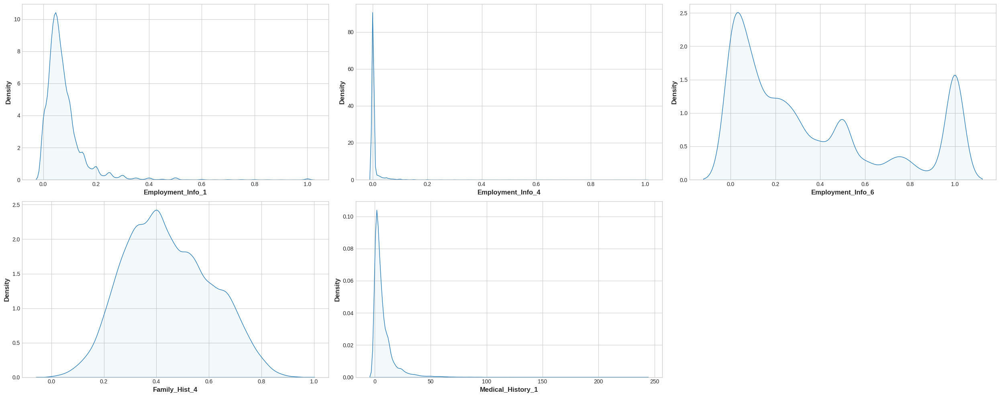

In [ ]:
# KDE Plots - Pre-imputation

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,10))

for i, column in enumerate(df_index_set[X_train_post_impute.columns].columns):
    sns.kdeplot(data=df_index_set[X_train_post_impute.columns],
                x=column,
                fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

fig.delaxes(axes[1,2])

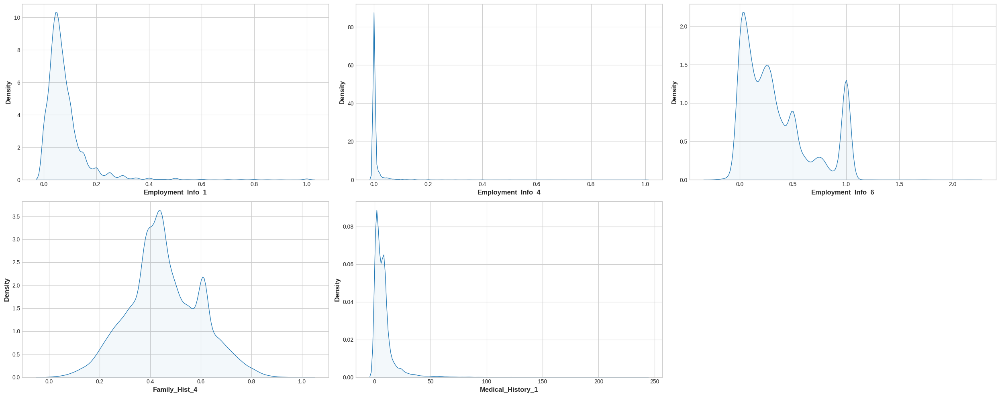

In [ ]:
# KDE Plots - Post-imputation

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25,10))

for i, column in enumerate(X_train_post_impute.columns):
    sns.kdeplot(data=X_train_post_impute,
                x=column,
                fill=True, common_norm=True, alpha=0.05,
                ax=axes[i//3,i%3])

fig.delaxes(axes[1,2])

As shown above, the distributions of three of the five columns remain largely unchanged. However, we have introduced additional probability density and peak splitting into `Family_Hist_4` (around x=0.4 and x=0.6) and `Medical_History_1` (around x=10).

It is important to be cautious later when evaluating the significance of these two features and explaining how predictions were generated for our chosen model. This is crucial because the changes in these distributions might influence how the model interprets and uses these features, potentially affecting the model's accuracy and reliability.

## 2.4 Review potential sources of data leakage

Data leakage or "data snooping" occurs when information from outside the training dataset is included in creating the model. We need to ensure that no aspect of data preprocessing, feature selection, or model evaluation is influenced by data that should not be known at the point of training. Examples of this includes data not available at the time of prediction and features based on the entire dataset, including the test set, rather than just the training set.

In this case the Response variable could artificially boost model performance and would not be indicative of real-world performance. Applying transformations such as scaling and normalization to the entire dataset before splitting would causes information leakage from the test set into the training process.

Other examples are when cross-validation folds are not properly managed, allowing data from the test fold to influence the training process, which can occur if time series data is randomly split without considering temporal order.Also including features directly correlated with the target variable but not available at the time of predictionc e.g. any variable that is a direct result of the target variable.

### Impact of Data Snooping

Impacts of data snooping would be that the above would results in the model appearing to perform much better on the test data than it would on unseen data. The model may not generalize well to new, unseen data because it has been influenced by information it wouldn't have in a real-world scenario.

### Avoiding Data Snooping

To avoid data snooping for this data set we take the following steps;

#### Data Splitting
We have split the data using train_test_split() into training, validation and test sets before any preprocessing steps.

#### Separate Data Processing
We apply data transformations within the training set only, n transformations to the validation and test sets.

#### Feature Engineering
Generally we should perform feature engineering only on the training set and then apply the engineered features to the test set without performing any recalculation.

#### Cross-Validation Practices
In general, we are using cross-validation techniques that respect the structure and any temporal aspects of the data (however we are not using timeseries data).

Carefully managing data preparation to ensure strict separation between training and evaluation phases, data snooping can be effectively avoided, leading to more accurate and reliable models.

# 3. Feature Engineering

## 3.1 Perform feature engineering (using training data)


In this section, we implement supervised (e.g. categorical encoding) and unsupervised (e.g. K-means clustering) learning techniques in order to create new features within our dataset that our models can be fitted to.

In [ ]:
# Create a clone of each imputed dataset to preserve the original data.
copy_X_train_imputed = X_train_imputed.copy()
copy_X_val_imputed = X_val_imputed.copy()
copy_X_test_imputed = X_test_imputed.copy()

### 3.1.1 One-Hot Encoding

We will convert the Product_Info_2 categorical column into numerical values by one-hot encoding, making it suitable for classification models.

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Set up one-hot encoding for categorical columns
OH_col = ['Product_Info_2']

# Configure one-hot encoder with handle_unknown='ignore' to handle unseen classes in validation data
# Set sparse=False to return encoded columns as a numpy array instead of a sparse matrix
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Apply one-hot encoding to categorical data columns
OH_col_train = pd.DataFrame(OH_encoder.fit_transform(copy_X_train_imputed[OH_col]))
OH_col_val = pd.DataFrame(OH_encoder.transform(copy_X_val_imputed[OH_col]))
OH_col_test = pd.DataFrame(OH_encoder.transform(copy_X_test_imputed[OH_col]))

# Restore the original index after one-hot encoding
OH_col_train.index = copy_X_train_imputed.index
OH_col_val.index = copy_X_val_imputed.index
OH_col_test.index = copy_X_test_imputed.index

# Restore column labels using the get_feature_names_out() function
OH_col_train.columns = OH_encoder.get_feature_names_out(OH_col)
OH_col_val.columns = OH_encoder.get_feature_names_out(OH_col)
OH_col_test.columns = OH_encoder.get_feature_names_out(OH_col)

# Create dataframes with only numerical features for concatenation with one-hot encoded dataframes
copy_X_train_imputed_no_OH_col = copy_X_train_imputed.drop(OH_col, axis=1)
copy_X_val_imputed_no_OH_col = copy_X_val_imputed.drop(OH_col, axis=1)
copy_X_test_imputed_no_OH_col = copy_X_test_imputed.drop(OH_col, axis=1)

# Combine one-hot encoded columns with existing numerical features
X_train_enc = pd.concat([copy_X_train_imputed_no_OH_col, OH_col_train], axis=1)
X_val_enc = pd.concat([copy_X_val_imputed_no_OH_col, OH_col_val], axis=1)
X_test_enc = pd.concat([copy_X_test_imputed_no_OH_col, OH_col_test], axis=1)

### 3.1.2 Scaling / Normalisation

Here, we perform min-max scaling on the encoded datasets, so that all features lie between 0 and 1 - so that, when training any of the classification models, all features will have variances with the same order of magnitude as each other. Thus, no single feature will dominate the objective function and prohibit the model from learning from other features correctly as expected.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize MinMaxScaler and fit it to the encoded training dataset
MM_scaler = MinMaxScaler()
MM_scaler.fit(X_train_enc)

# Normalize/transform training, validation, and test datasets
X_train_scale = pd.DataFrame(MM_scaler.transform(X_train_enc),
                             index=X_train_enc.index,
                             columns=X_train_enc.columns)

X_val_scale = pd.DataFrame(MM_scaler.transform(X_val_enc),
                             index=X_val_enc.index,
                             columns=X_val_enc.columns)

X_test_scale = pd.DataFrame(MM_scaler.transform(X_test_enc),
                             index=X_test_enc.index,
                             columns=X_test_enc.columns)

### 3.1.3 K-means clustering

We’ll use K-means clustering to group applicants by their similarities. First, we train the algorithm on the training subset, then predict cluster groups for all three subsets.

These cluster labels will be incorporated as an additional feature in our datasets, and may in fact prove to be useful in helping to understand applicants' risk rating assignments later on.

In [ ]:
# Create copies of the scaled datasets for K-Means clustering
copy_X_train_scale = X_train_scale.copy()
copy_X_val_scale = X_val_scale.copy()
copy_X_test_scale = X_test_scale.copy()

from sklearn.cluster import KMeans

We now use the elbow-analysis method to determine the optimal number of clusters to use.

In [ ]:
# Find the optimal number of clusters
# Cluster data for k values from 1 to 30 and compute inertia (sum of squared distances)

Sum_of_squared_distances = []
K = range(1,30)
for k in K:
    km = KMeans(n_clusters=k, n_init=10)
    km = km.fit(copy_X_train_scale)
    Sum_of_squared_distances.append(km.inertia_)

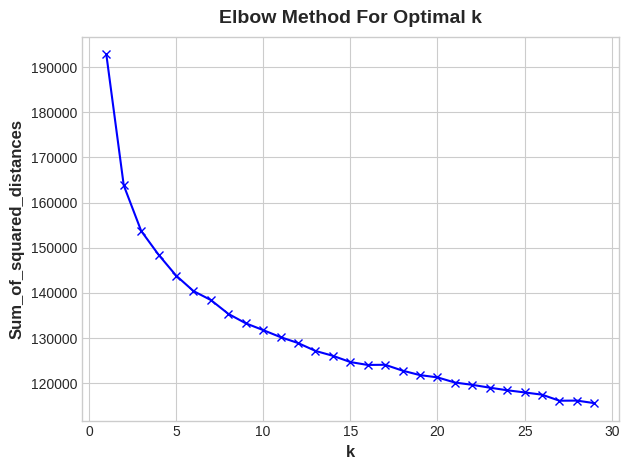

In [ ]:
# Plot K-values against their corresponding inertias (sums of squared distances)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

As shown above, the "elbow" of the curve begins to form at k=15.

Increasing k beyond this value does not yield a significant benefit in the rate of reduction in the training dataset's inertia - so, we will set k=15 when initialising the KMeans() clustering algorithm below.

In [ ]:
# Set n_clusters=15 based on elbow method analysis
kmeans = KMeans(n_clusters=15, n_init=10, random_state=0)

# Fit K-Means algorithm to training data and predict clusters for train, validation, and test datasets
copy_X_train_scale["Cluster"] = kmeans.fit_predict(copy_X_train_scale)
copy_X_val_scale["Cluster"] = kmeans.predict(copy_X_val_scale)
copy_X_test_scale["Cluster"] = kmeans.predict(copy_X_test_scale)

# Convert cluster labels to one-hot encoded format
X_train_cluster_OH_enc = pd.get_dummies(copy_X_train_scale.Cluster).add_prefix('KMeansCluster_')
X_val_cluster_OH_enc = pd.get_dummies(copy_X_val_scale.Cluster).add_prefix('KMeansCluster_')
X_test_cluster_OH_enc = pd.get_dummies(copy_X_test_scale.Cluster).add_prefix('KMeansCluster_')

# Merge K-Means clustering labels with the original dataframes
X_train_KMeans = pd.concat([copy_X_train_scale, X_train_cluster_OH_enc], axis=1)
X_val_KMeans = pd.concat([copy_X_val_scale, X_val_cluster_OH_enc], axis=1)
X_test_KMeans = pd.concat([copy_X_test_scale, X_test_cluster_OH_enc], axis=1)

# Remove original "Cluster" columns from each dataset
X_train_KMeans = X_train_KMeans.drop(['Cluster'], axis=1)
X_val_KMeans = X_val_KMeans.drop(['Cluster'], axis=1)
X_test_KMeans = X_test_KMeans.drop(['Cluster'], axis=1)

## 3.2 Perform feature selection (using validation data)

In this section, we use various methods to identify the most important features for each classification model to prevent overfitting.

Now, we switch to the validation dataset for feature selection and model refinement to avoid over-reliance on the training dataset and prevent data leakage.

### 3.2.1 Method 1: Mutual Information (MI)

We’ll calculate the MI scores for the validation dataset using two custom functions based on `mutual_info_classif()` from sklearn. This will help identify which features are valuable and should be preserved during feature selection.

In [ ]:
# Import mutual_info_classif from sklearn
from sklearn.feature_selection import mutual_info_classif

# Define a function to calculate Mutual Information (MI) scores for a dataset
def make_mi_scores(X, y):
    mi_scores = mutual_info_classif(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

# Define a function to plot MI scores in descending order of importance
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

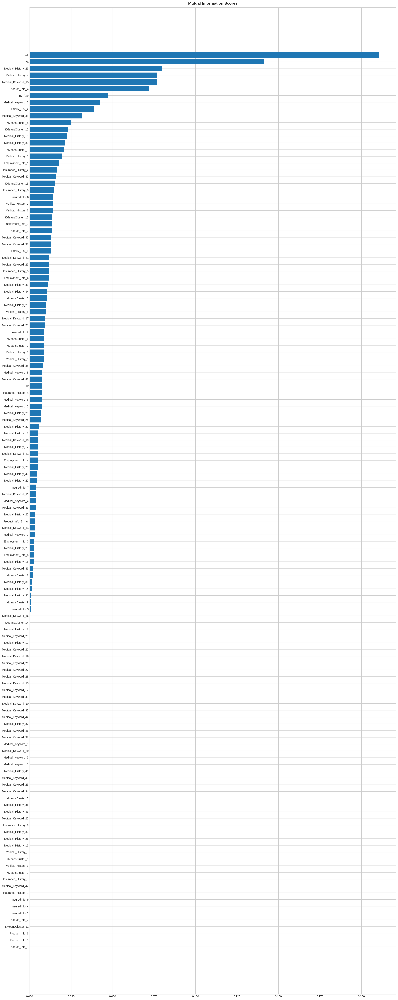

In [ ]:
# Compute MI scores for the validation dataset
mi_scores_X_val = make_mi_scores(X_val_KMeans, y_val)

# Plot MI scores from the validation dataset
plt.figure(dpi=100, figsize=(20,50))
plot_mi_scores(mi_scores_X_val)

The chart shows that the top 5 features, ranked in descending order, are BMI, Wt, Product_Info_4, Medical_Keyword_15, and Medical_History_23. These features have strong statistical relationships with the Response variable, significantly reducing uncertainty.

Features with low or zero MI scores contribute minimally to reducing this uncertainty and are therefore less useful for predictions.

### 3.2.2 Method 2: Multicollinearity analysis

We will now perform Variance Inflation Factor (VIF) analysis to detect multicollinearity, where independent variables are highly correlated, affecting the reliability of our model.

This will help identify redundant features that should be discarded during feature selection.

In [ ]:
# Import variance_inflation_factor from statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define a function to calculate variance inflation factor (VIF) scores for assessing multicollinearity
def calc_vif(X):
    vif = pd.DataFrame()
    vif["Variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

# Filter to include only numeric columns before calculating VIF
# This avoids TypeError due to non-numeric data in calc_vif function
X_val_KMeans_numeric = X_val_KMeans.select_dtypes(include=[np.number])

# Calculate VIF scores for the numeric columns in the validation dataset
vif_scores = calc_vif(X_val_KMeans_numeric)
# Ignore "RuntimeWarning: divide by zero" due to perfectly correlated dummy variables

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1785: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


,Variables,VIF
1,Product_Info_3,59.419387
6,Ins_Age,15.199446
7,Ht,1468.410060
8,Wt,580.891692
9,BMI,574.150018
10,Employment_Info_2,10.707951
20,Insurance_History_1,69.910903
22,Insurance_History_3,134.378070
23,Insurance_History_4,22.562908
24,Insurance_History_7,48.202031


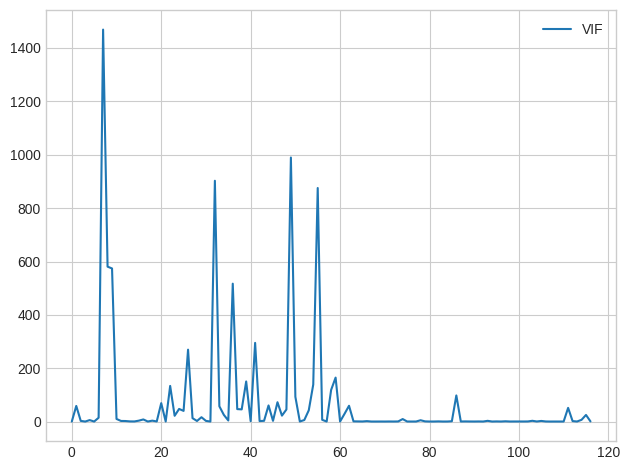

In [ ]:
# Plot VIF scores for the validation dataset
vif_scores.plot()

# Display columns with VIF scores greater than 10
vif_scores.loc[vif_scores['VIF'] > 10]

The features listed above have very high VIF scores, which indicate a high level of multicollinearity. However, in the edge cases where some of these values tend towards infinity, these can be discounted as they represent dummy variables that are perfectly anti-correlated (e.g. one applicant/row in the dataset can only belong to a single K-Means cluster).

More information on when it is safe to ignore multicollinearity can be found here: [Multicollinearity - Statistical Horizons](https://statisticalhorizons.com/multicollinearity/).

### 3.2.3 Method 3: Principal Component Analysis

Next, we’ll perform Principal Component Analysis (PCA) to identify the main sources of variation in our dataset. This will guide us in selecting the most valuable features to retain.

In [ ]:
# Import and initialize key modules for visualizing Principal Component Analysis (PCA)
from IPython.display import display

plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)

<ipython-input-149-5a4ddfb3a706>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


In [ ]:
# Define a function to plot explained and cumulative variances for each Principal Component (PC) of a dataset

def plot_variance(pca, width=8, dpi=100):
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)

    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(xlabel="Component",
               title="% Explained Variance",
               ylim=(0.0, 0.2))

    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(xlabel="Component",
               title="% Cumulative Variance",
               ylim=(0.0, 1.0))

    fig.set(figwidth=8, dpi=100)
    return axs

In [ ]:
from sklearn.decomposition import PCA

# Set up the Principal Component Analysis (PCA) algorithm.
pca = PCA()

# Apply PCA to the validation dataset and compute the principal components
X_val_pca = pca.fit_transform(X_val_KMeans)

# Generate labels for each principal component, corresponding to the number of columns in the validation dataset
X_val_component_names = [f"PC{i+1}" for i in range(X_val_pca.shape[1])]

# Construct a dataframe with the principal components and their associated labels
X_val_pca = pd.DataFrame(X_val_pca, columns=X_val_component_names)

array([<Axes: title={'center': '% Explained Variance'}, xlabel='Component'>,
       <Axes: title={'center': '% Cumulative Variance'}, xlabel='Component'>],
      dtype=object)

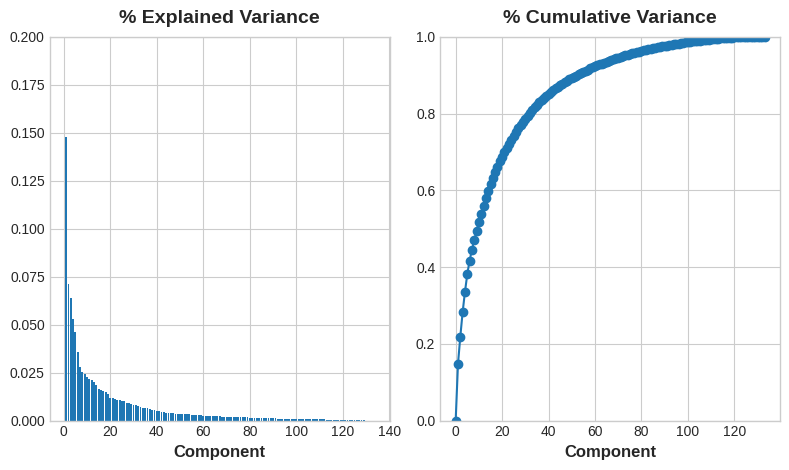

In [ ]:
# Utilize the custom function to visualize explained and cumulative variances for each principal component in the validation dataset
plot_variance(pca)

In [ ]:
# Compute the cumulative sum of explained variance ratios for the first 40 principal components in the validation dataset
pca.explained_variance_ratio_[:40].cumsum()

array([0.14782676, 0.21895306, 0.28265223, 0.33543821, 0.38144677,
       0.41705857, 0.44500829, 0.47037174, 0.49489165, 0.51766177,
       0.53929665, 0.56022621, 0.58033055, 0.599117  , 0.61563046,
       0.63147525, 0.64703924, 0.66172336, 0.67563051, 0.68765537,
       0.69923995, 0.71044408, 0.72122103, 0.73174433, 0.74195844,
       0.75203919, 0.76123972, 0.77021924, 0.77909299, 0.78708367,
       0.79501209, 0.80263371, 0.80992618, 0.81671497, 0.82327441,
       0.82967789, 0.83570296, 0.84124797, 0.84652776, 0.85159339])

As shown earlier, the first 40 PCs account for just over 80% of the cumulative variance in the validation dataset.

This indicates that using a lower-dimensional feature space can capture most of the dataset's variance, rather than using all features.

In [ ]:
# Create a dataframe showing the loadings of each principal component on the original features

X_val_loadings = pd.DataFrame(
    pca.components_.T,  # Transpose the matrix of loadings
    columns=X_val_component_names,  # Set columns to be the principal components
    index=X_val_KMeans.columns,  # Set rows to represent the original features
)
X_val_loadings


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133
Product_Info_1,-0.003794,-0.002817,-0.013725,-0.002994,0.018925,-0.012678,0.019931,-0.008343,0.008550,-0.004237,...,0.001934,0.000399,-0.000513,-0.000680,0.000114,0.001910,-0.001167,0.000648,-2.528721e-17,0.000000e+00
Product_Info_3,0.005680,-0.010101,-0.099699,-0.031197,-0.026741,-0.037806,0.044850,0.017796,-0.063294,0.081073,...,-0.010400,-0.005178,-0.003143,-0.000766,0.001624,-0.001722,0.001011,0.001388,-2.181087e-16,6.683747e-17
Product_Info_4,-0.012015,-0.104664,-0.070933,-0.028164,0.004990,-0.096209,0.103042,-0.034451,-0.018602,0.036230,...,0.001656,-0.000682,-0.006868,0.000568,0.001307,-0.000016,-0.000274,0.000106,3.052270e-17,8.507827e-18
Product_Info_5,0.001900,-0.002519,-0.007133,-0.000482,-0.000478,-0.004999,0.001196,-0.002187,0.005238,-0.001235,...,-0.002448,0.001206,-0.007009,0.000017,0.000080,-0.000102,-0.000434,0.001322,-1.095969e-16,5.507179e-18
Product_Info_6,-0.004604,0.003765,0.031883,0.020872,-0.035022,0.107382,-0.222472,0.009476,-0.088965,0.304453,...,0.001055,-0.000333,0.000225,0.000058,0.000053,-0.000084,-0.000380,-0.000398,1.896587e-17,-1.110222e-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KMeansCluster_10,-0.045677,0.167227,0.000624,-0.033457,-0.110535,0.051190,0.030259,-0.025039,-0.049948,0.010470,...,0.000232,-0.006055,0.004879,0.003995,0.004245,0.001286,0.329970,-0.001714,2.581989e-01,5.987481e-16
KMeansCluster_11,-0.082279,0.040796,0.161549,0.048191,0.095512,-0.084343,-0.015606,-0.125511,0.050406,-0.098895,...,-0.000413,-0.001105,0.002132,-0.000881,0.002712,0.000380,0.330246,-0.003664,2.581989e-01,5.192992e-16
KMeansCluster_12,0.050554,-0.111340,0.185923,-0.163251,0.072364,0.059610,-0.086835,-0.007957,-0.077764,0.033953,...,-0.000673,0.000037,-0.001393,-0.000392,-0.000302,-0.001679,-0.162998,-0.000217,2.581989e-01,4.838512e-16
KMeansCluster_13,-0.111407,-0.048249,0.125397,0.053657,-0.049620,0.165075,0.023335,0.150882,-0.113230,0.098008,...,-0.000115,-0.000684,0.000352,0.000388,0.002154,-0.001558,0.330645,-0.004179,2.581989e-01,5.158154e-16


We can also visualize how each principal component is composed of the original features' loadings.

By examining the top 40 principal components, we can identify which original features most significantly contribute to the cumulative variance in the validation dataset.

In [ ]:
X_val_loadings_first40 = X_val_loadings.iloc[:, :40]
X_val_loadings_first40

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40
Product_Info_1,-0.003794,-0.002817,-0.013725,-0.002994,0.018925,-0.012678,0.019931,-0.008343,0.008550,-0.004237,...,-0.010385,-0.023208,-0.001759,0.012972,0.061745,0.055762,-0.039039,-0.028280,0.009472,0.007023
Product_Info_3,0.005680,-0.010101,-0.099699,-0.031197,-0.026741,-0.037806,0.044850,0.017796,-0.063294,0.081073,...,-0.007616,-0.009761,-0.014974,0.028730,0.028739,0.019292,-0.019315,-0.007035,0.033805,0.006119
Product_Info_4,-0.012015,-0.104664,-0.070933,-0.028164,0.004990,-0.096209,0.103042,-0.034451,-0.018602,0.036230,...,0.018099,-0.032464,0.081276,-0.029354,0.014267,0.021926,0.018543,0.010923,-0.063111,0.002190
Product_Info_5,0.001900,-0.002519,-0.007133,-0.000482,-0.000478,-0.004999,0.001196,-0.002187,0.005238,-0.001235,...,0.001935,-0.001709,0.006404,-0.000842,-0.002694,0.009037,-0.004798,-0.010812,-0.005233,-0.002864
Product_Info_6,-0.004604,0.003765,0.031883,0.020872,-0.035022,0.107382,-0.222472,0.009476,-0.088965,0.304453,...,0.004185,0.030199,-0.014256,-0.033068,-0.049705,-0.041689,0.020445,0.010232,0.030465,-0.000980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KMeansCluster_10,-0.045677,0.167227,0.000624,-0.033457,-0.110535,0.051190,0.030259,-0.025039,-0.049948,0.010470,...,-0.266782,0.139541,-0.154871,0.029266,0.088371,0.056082,-0.037089,-0.101480,0.040073,-0.010761
KMeansCluster_11,-0.082279,0.040796,0.161549,0.048191,0.095512,-0.084343,-0.015606,-0.125511,0.050406,-0.098895,...,0.044512,0.199992,-0.166628,-0.089286,-0.026644,0.028936,0.052721,-0.143136,-0.002406,0.010160
KMeansCluster_12,0.050554,-0.111340,0.185923,-0.163251,0.072364,0.059610,-0.086835,-0.007957,-0.077764,0.033953,...,0.164677,-0.188297,-0.026990,0.094172,-0.021324,-0.090237,-0.031643,-0.197640,0.048310,0.027231
KMeansCluster_13,-0.111407,-0.048249,0.125397,0.053657,-0.049620,0.165075,0.023335,0.150882,-0.113230,0.098008,...,0.060342,-0.194677,-0.124453,0.250820,-0.049289,-0.138101,-0.115314,-0.047605,-0.037004,0.048811


In [ ]:
useful_cols = []

# Visualize columns in the top 40 PCs with significant variance (absolute PC loading > 0.25)
for col in X_val_loadings_first40.columns:
    cols = X_val_loadings_first40[col].loc[abs(X_val_loadings_first40[col]) > 0.25]
    cols_df = pd.DataFrame(cols)
    useful_cols.append(cols_df)

useful_cols

[                          PC1
 Insurance_History_1 -0.292631
 Insurance_History_3  0.492932
 Insurance_History_4 -0.463487
 Insurance_History_7 -0.471939
 Insurance_History_9 -0.250755,
                          PC2
 Medical_History_23 -0.480390
 Medical_History_29 -0.252173
 Medical_History_41  0.264561
 Medical_Keyword_15  0.431083,
                         PC3
 InsuredInfo_6      0.678283
 Medical_History_4  0.353268,
                           PC4
 Insurance_History_1 -0.569992
 Insurance_History_8 -0.618340
 KMeansCluster_8      0.251312,
                          PC5
 Medical_History_4  -0.433433
 Medical_History_23  0.316531
 Medical_History_33 -0.341495
 Medical_History_41  0.335574
 Medical_Keyword_15 -0.296958
 Medical_Keyword_23  0.342512,
                          PC6
 InsuredInfo_6       0.280850
 Medical_History_4  -0.251085
 Medical_History_29  0.373417
 Medical_History_41 -0.541094
 KMeansCluster_0    -0.264242,
                          PC7
 Medical_History_4   0.5369

The cell above shows which columns/features are most frequently present among the top 40 PCs, which account for over 80% of the dataset's cumulative variance.

The more frequently a column name appears above, the more indicative this is that the column is useful for capturing significant variance within the dataset. It is thus more important for the models to place greater importance on these features later on.

### 3.3.4 Method 4: Lasso (L1) Regularisation

Finally, we will perform feature selection via L1 (lasso) regularisation using functions that are readily available in sklearn - for more information, see this link: [Feature Selection via scikit-learn](https://scikit-learn.org/stable/modules/feature_selection.html#l1-based-feature-selection)

In [ ]:
# Import essential modules for LASSO-based feature selection
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel

# Set up the Lasso (L1) Regularization model for feature selection
linearsvc = LinearSVC(penalty="l1", dual=False, tol=1e-3, C=1e-2, random_state=0).fit(X_val_KMeans, y_val)
model = SelectFromModel(linearsvc, prefit=True)

# Reduce the dataset to the most important features, using the regularisation model above.
X_val_L1 = model.transform(X_val_KMeans)

# Convert the transformed dataset into a dataframe matching the original size/shape
# Replaced removed features with zeroes in this dataframe
selected_features = pd.DataFrame(model.inverse_transform(X_val_L1),
                                 index=X_val_KMeans.index,
                                 columns=X_val_KMeans.columns)

# Remove columns from the dataframe with zero variance, indicating unimportant features
X_val_L1reg = selected_features.drop(selected_features.columns[selected_features.var() == 0], axis=1)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [ ]:
# Count the number of columns retained after L1 regularization

len(selected_features.columns[selected_features.var() != 0])

50

We have now reduced our dataset down to 57 features, from a starting value of 126.

Next, we will transform our training/test subsets so that they are now constrained to the same set of columns as derived above.

In [ ]:
# Generate a list of columns retained after L1 regularization
selected_columns = selected_features.columns[selected_features.var() != 0]

# Align the training and test datasets to the same set of columns
X_train_L1reg = X_train_KMeans[selected_columns]
X_test_L1reg = X_test_KMeans[selected_columns]

# 4. Supervised Methods

## 4.1 Define Models

In this project, we aim to predict the target (Response) as well as the likelihood of belonging to the predicted group using the following approaches:

### Logistic/Softmax Regression
**Softmax Regression** is a generalised form of the standard logistic regression model. Given an instance  
$\mathbf{X}$, input features are supplied to the model in order to compute a score for each class - then, the probability of $\mathbf{X}$ belonging to each class is estimated by applying the softmax function (which calculates the exponential of every score, then normalises them). Then, the algorithm returns a prediction as the class with the highest estimated probability (simply the class with the highest score).

### Gaussian Naive Bayes
**Gaussian Naive Bayes** works as an extension of Naive Bayes (which is termed as "naive" due to its main assumption that all features are independent), by instead assuming that each feature within the data can be represented by a normal/Gaussian distribution. As a result, we only need to calculate the mean/standard deviation of each Gaussian distribution in order to predict the likelihood of an instance belonging to a given class, reducing computational complexity as compared to using other Bayesian methods.

### Support Vector Machines
**Support Vector Machines** are capable of performing linear or nonlinear classification, and are particularly well-suited for classification of complex small- and medium-sized datasets/segmentation of high dimensionality feature spaces. They essentially work by fitting the widest possible margin between each of the classes, as a function of each of the dataset's features. As can be imagined, this technique is sensitive to feature scaling, which is why min-max scaling was performed earlier above.

### Decision Trees/Random Forests
**Decision Trees** are powerful and versatile algorithms that are capable of fitting to/classifying complex datasets. They are generated by splitting a training dataset into two subsets recursively, based on a single feature and a corresponding threshold value (which are chosen as the pair that produces subsets with the lowest possible Gini impurity).

**Random Forest Classification** works by training multiple decision trees, based on the random sampling (with replacement) of a training dataset. Input features from an unseen dataset can then be supplied to each trained decision tree in order to generate a prediction, which is subsequently averaged across all predictions to produce a final classification output; averaging across all predictions has the benefit of reducing overfitting to any given random sample within the training set.

### Gradient Boosting Classifiers

Boosting is an ensemble technique that combines multiple weak learners into a strong learner by training them sequentially, where each learner aims to correct the errors of its predecessor.

In **AdaBoost**, a base classifier (like a Decision Tree) is trained and used to make predictions. The algorithm then adjusts the weights of misclassified instances and trains a new classifier with these updated weights. This process repeats until performance improvements plateau or the maximum iterations are reached.

**Gradient Boosting** works similarly but instead of adjusting instance weights, each new predictor is trained to address the residual errors of the previous predictor. This iterative approach refines the model to capture complex patterns but requires caution to avoid overfitting.

In [ ]:
# Import the classification models from sklearn/xgboost.

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

## 4.2 Optimize Hyperparameters


In this section, we'll employ comprehensive parameter tuning techniques to enhance various model configurations. The following models and their adjustable parameters will be explored:

For LogisticRegression:
- Convergence criterion threshold
- Model fit intensity control

GaussianNB:
- Distribution smoothing factor

SVC with linear kernel:
- Model fit intensity control
- Convergence criterion threshold

LinearSVC:
- Convergence criterion threshold
- Model fit intensity control

SVC with polynomial kernel:
- Model fit intensity control
- Polynomial function order
- Convergence criterion threshold

SVC with RBF kernel:
- Model fit intensity control
- Convergence criterion threshold

SVC with sigmoid kernel:
- Model fit intensity control
- Convergence criterion threshold

DecisionTreeClassifier:
- Tree growth limit
- Feature subset size for split evaluation

RandomForestClassifier:
- Number of tree estimators
- Tree growth limit
- Feature subset size for split evaluation

AdaBoostClassifier:
- Maximum iteration count
- Estimator contribution factor

GradientBoostingClassifier:
- Estimator contribution factor
- Maximum iteration count

XGBClassifier:
- Maximum iteration count
- Estimator contribution factor

For more details on these parameter tuning methods and grid search, refer to the [scikit-learn documentation](
https://scikit-learn.org/stable/modules/grid_search.html#exhaustive-grid-search)

In [ ]:
# Import the GridSearchCV function from sklearn.

from sklearn.model_selection import GridSearchCV

### 4.2.1 Initialise each model

We set up each of the classifiers as baseline models, by initialising each model as a new object.

In [ ]:
## Initialize classifiers that provide both predictions and associated probabilities/likelihoods/confidences

### Logistic and softmax regressors
Model1_Base = LogisticRegression(random_state=0,
                                 solver='liblinear')

### Naive Bayes classifiers
Model2_Base = GaussianNB()

### Support Vector Machines (linear/non-linear)
Model3_Base = SVC(kernel='linear',
                  probability=True,
                  max_iter=1000,
                  random_state=0)

Model4_Base = LinearSVC(dual=False,
                        random_state=0,
                        max_iter=1000)

Model5_Base = SVC(kernel='poly',
                  probability=True,
                  max_iter=1000,
                  random_state=0)

Model6_Base = SVC(kernel='rbf',
                  probability=True,
                  max_iter=1000,
                  random_state=0)

Model7_Base = SVC(kernel='sigmoid',
                  probability=True,
                  max_iter=1000,
                  random_state=0)

### Decision Trees
Model8_Base = DecisionTreeClassifier(random_state=0)

### Random Forest classifiers
Model9_Base = RandomForestClassifier(n_jobs=-1,
                                     random_state=0)

### Gradient Boosting Machines (GBMs)
Model10_Base = AdaBoostClassifier(random_state=0)

Model11_Base = GradientBoostingClassifier(random_state=0)

Model12_Base = XGBClassifier(random_state=0,
                             n_jobs=-1,
                             eval_metric="merror")

### 4.2.2 Declare the hyperparameter grids for each model

Next, we declare the models' parameter grids that we require the grid-searches to be performed over.

In [ ]:
# Hyperparameter settings for LogisticRegression.
param_grid_model1 = {'tol': [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001],
                     'C': [100.0, 10.0, 1.0, 0.1, 0.01, 0.001]}

# Hyperparameter settings for GaussianNB.
param_grid_model2 = {'var_smoothing': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06, 1e-07, 1e-08, 1e-09, 1e-10]}

# Hyperparameter settings for SVC with linear kernel.
param_grid_model3 = {'C': [100, 10, 1.0, 0.1, 0.01, 0.001],
                     'tol': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06]}

# Hyperparameter settings for LinearSVC.
param_grid_model4 = {'tol': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06],
                     'C': [100, 10, 1.0, 0.1, 0.01, 0.001]}

# Hyperparameter settings for SVC with polynomial kernel.
param_grid_model5 = {'C': [100, 10, 1.0, 0.1, 0.01, 0.001],
                     'degree': [0, 1, 2, 3, 4, 5, 6],
                     'tol': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06]}

# Hyperparameter settings for SVC with rbf kernel.
param_grid_model6 = {'C': [100, 10, 1.0, 0.1, 0.01, 0.001],
                     'tol': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06]}

# Hyperparameter settings for SVC with sigmoid kernel.
param_grid_model7 = {'C': [100, 10, 1.0, 0.1, 0.01, 0.001],
                     'tol': [1e-01, 1e-02, 1e-03, 1e-04, 1e-05, 1e-06]}

# Hyperparameter settings for DecisionTreeClassifier.
param_grid_model8 = {'max_depth': [5, 10, 15, 20, 25, 30, 35, 40],
                     'max_features': [0.2, 0.4, 0.6, 0.8, 1.0]}

# Hyperparameter settings for RandomForestClassifier.
param_grid_model9 = {'n_estimators': [10, 100, 250, 500, 1000],
                     'max_depth': [5, 10, 15, 20, 25, 30, 35, 40],
                     'max_features': [0.2, 0.4, 0.6, 0.8, 1.0]}

# Hyperparameter settings for AdaBoostClassifier.
param_grid_model10 = {'n_estimators': [10, 100, 250, 500, 1000],
                      'learning_rate': [1e-0, 1e-01, 1e-02, 1e-03, 1e-04, 1e-05]}

# Hyperparameter settings for GradientBoostingClassifier.
param_grid_model11 = {'learning_rate': [1e-0, 1e-01, 1e-02, 1e-03, 1e-04, 1e-05],
                      'n_estimators': [10, 100, 250, 500, 1000]}

# Hyperparameter settings for XGBClassifier.
param_grid_model12 = {'n_estimators': [10, 100, 250, 500, 1000],
                      'learning_rate': [1e-0, 1e-01, 1e-02, 1e-03, 1e-04, 1e-05]}

# List of baseline models.
BaseModels = [Model1_Base, Model2_Base, Model3_Base,
              Model4_Base, Model5_Base, Model6_Base,
              Model7_Base, Model8_Base, Model9_Base,
              Model10_Base, Model11_Base, Model12_Base]

# List of parameter grids for each model.
ParamGrids = [param_grid_model1, param_grid_model2, param_grid_model3,
              param_grid_model4, param_grid_model5, param_grid_model6,
              param_grid_model7, param_grid_model8, param_grid_model9,
              param_grid_model10, param_grid_model11, param_grid_model12]

### 4.2.3 Define a Custom Grid Search Function to Time Experiments

To run grid searches sequentially in one loop, we define a custom function that performs grid search optimization for a specified model and returns an object with optimized hyperparameters for easy retrieval.

In [ ]:
from datetime import datetime
import pytz

# Define a function to perform grid search for a specified model and parameter grid
def GridSearcher(model, param_grid):
    ## Initialize setup
    timezone = pytz.timezone('Europe/London')
    start_time = datetime.now(timezone)
    print("Running GridSearchCV for:", str(model))
    print("Starting at:",start_time.strftime("%H:%M:%S"))

    ## Perform the grid-search
    GridSearcher = GridSearchCV(model, param_grid, scoring='balanced_accuracy', refit=False, error_score='raise', verbose=2)
    GridSearcher.fit(X_valid_L1reg, y_valid)
    # HOLDOUT n_jobs=-1

    ## Complete
    finish_time = datetime.now(timezone)
    print("Finished at:", finish_time.strftime("%H:%M:%S"))
    duration = finish_time - start_time
    dur = divmod(duration.seconds, 60)
    print("Duration: ", dur[0], 'minutes', dur[1], 'seconds')
    return GridSearcher

### 4.2.4 Execute Grid Searches for All Models

For each model, we loop through the custom grid-search function and retrieve its optimised hyperparameters.

**This section takes several hours to run.**

In [ ]:
##     tz = pytz.timezone('Europe/London')
##     start = datetime.now(tz)
##     print("GridSearchCV runs starting at:",start.strftime("%H:%M:%S"))

##     for i in range(0, 12):
##         GridSearchResult = GridSearcher(BaseModels[i], ParamGrids[i])
##         print(GridSearchResult.best_params_)
##         GridSearchResults.append(GridSearchResult)

##     finish = datetime.now(tz)
##     print("GridSearchCV runs finished at:", finish.strftime("%H:%M:%S"))
##     duration = finish - start
##     dur = divmod(duration.seconds, 60)
##     print("Total Duration: ", dur[0], 'minutes', dur[1], 'seconds')

##     for i in GridSearchResults:
##         print(i.best_params_)

In [ ]:
# The optimized hyperparameters were obtained from the previous cell

Model1_Opt_Params = {'C': 100.0, 'tol': 0.01}
Model2_Opt_Params = {'var_smoothing': 0.0001}
Model3_Opt_Params = {'C': 1.0, 'tol': 0.1}
Model4_Opt_Params = {'C': 100, 'tol': 0.001}
Model5_Opt_Params = {'C': 0.1, 'degree': 6, 'tol': 0.1}
Model6_Opt_Params = {'C': 10, 'tol': 0.01}
Model7_Opt_Params = {'C': 1.0, 'tol': 0.01}
Model8_Opt_Params = {'max_depth': 10, 'max_features': 0.8}
Model9_Opt_Params = {'max_depth': 40, 'max_features': 0.6, 'n_estimators': 1000}
Model10_Opt_Params = {'learning_rate': 1.0, 'n_estimators': 100}
Model11_Opt_Params = {'learning_rate': 0.1, 'n_estimators': 250}
Model12_Opt_Params = {'learning_rate': 1.0, 'n_estimators': 10}

# Create a list of optimized hyperparameters for each model
OptimisedParams = [Model1_Opt_Params, Model2_Opt_Params, Model3_Opt_Params,
                   Model4_Opt_Params, Model5_Opt_Params, Model6_Opt_Params,
                   Model7_Opt_Params, Model8_Opt_Params, Model9_Opt_Params,
                   Model10_Opt_Params, Model11_Opt_Params, Model12_Opt_Params]

### 4.2.5 Update Baseline Models with Optimized Hyperparameters

Finally, updating baseline models declared earlier above, by passing the optimised hyperparameters to each model using the `.set_params(**kwargs)` method.

In [ ]:
OptimisedModels = []

# Apply optimized hyperparameters to baseline models
for i in range(0, 12):
    OptimisedModel = BaseModels[i].set_params(**OptimisedParams[i])
    OptimisedModels.append(OptimisedModel)

OptimisedModels

[LogisticRegression(C=100.0, random_state=0, solver='liblinear', tol=0.01),
 GaussianNB(var_smoothing=0.0001),
 SVC(kernel='linear', max_iter=1000, probability=True, random_state=0, tol=0.1),
 LinearSVC(C=100, dual=False, random_state=0, tol=0.001),
 SVC(C=0.1, degree=6, kernel='poly', max_iter=1000, probability=True,
     random_state=0, tol=0.1),
 SVC(C=10, max_iter=1000, probability=True, random_state=0, tol=0.01),
 SVC(kernel='sigmoid', max_iter=1000, probability=True, random_state=0, tol=0.01),
 DecisionTreeClassifier(max_depth=10, max_features=0.8, random_state=0),
 RandomForestClassifier(max_depth=40, max_features=0.6, n_estimators=1000,
                        n_jobs=-1, random_state=0),
 AdaBoostClassifier(n_estimators=100, random_state=0),
 GradientBoostingClassifier(n_estimators=250, random_state=0),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, ea

## 4.3 Train Models (using training data)

In this section, we will now train our optimised models on the encoded training dataset.

In [ ]:
# Create a duplicate of the OptimisedModels list for model training
TrainedModels = OptimisedModels

XGBoost's classifiers require labels to be supplied in a zero-based fashion (i.e. classes 1-8 must instead be converted into labels 0-7 prior to training/prediction). Previously, this would have been handled automatically via the use of the `use_label_encoder` keyword argument - however, we must now explicitly label-encode our dataset prior to fitting/predicting as this has since become deprecated.

Hence, we will establish a label encoder that converts the classes into compatible labels.

In [ ]:
# Label-encode datasets for compatibility with XGBoost classifier (model 12); "use_label_encoder" is deprecated
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

# Convert class labels (1-8) to encoded labels (0-7)
y_train = le.fit_transform(y_train)
y_val = le.transform(y_val)
y_test = le.transform(y_test)

In [ ]:
#print(y_train)
#print(y_val.unique())
#print(y_test.unique())

We can now train all of our models using the encoded/transformed labels.

In [ ]:
# Train each optimized model using the training dataset
for model in TrainedModels:
    tz = pytz.timezone('Europe/London')
    start = datetime.now(tz)
    print("Model training started at:",start.strftime("%H:%M:%S"))
    model.fit(X_train_L1reg, y_train)
    finish = datetime.now(tz)
    print("Model training finished at:",finish.strftime("%H:%M:%S"))
    duration = finish - start
    dur = divmod(duration.seconds, 60)
    print("Total Duration for model training: ", dur[0], 'minutes', dur[1], 'seconds')
    print("Model "+str(TrainedModels.index(model)+1)+" - "+model.__class__.__name__+" has been trained.")

Model training started at: 12:50:40
Model training finished at: 12:50:49
Total Duration for model training:  0 minutes 9 seconds
Model 1 - LogisticRegression has been trained.
Model training started at: 12:50:49
Model training finished at: 12:50:49
Total Duration for model training:  0 minutes 0 seconds
Model 2 - GaussianNB has been trained.
Model training started at: 12:50:49


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Model training finished at: 12:55:15
Total Duration for model training:  4 minutes 25 seconds
Model 3 - SVC has been trained.
Model training started at: 12:55:15
Model training finished at: 12:55:23
Total Duration for model training:  0 minutes 8 seconds
Model 4 - LinearSVC has been trained.
Model training started at: 12:55:23


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Model training finished at: 13:00:39
Total Duration for model training:  5 minutes 16 seconds
Model 5 - SVC has been trained.
Model training started at: 13:00:39


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Model training finished at: 13:05:36
Total Duration for model training:  4 minutes 57 seconds
Model 6 - SVC has been trained.
Model training started at: 13:05:36


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Model training finished at: 13:12:13
Total Duration for model training:  6 minutes 36 seconds
Model 7 - SVC has been trained.
Model training started at: 13:12:13
Model training finished at: 13:12:13
Total Duration for model training:  0 minutes 0 seconds
Model 8 - DecisionTreeClassifier has been trained.
Model training started at: 13:12:13
Model training finished at: 13:15:39
Total Duration for model training:  3 minutes 25 seconds
Model 9 - RandomForestClassifier has been trained.
Model training started at: 13:15:39
Model training finished at: 13:15:43
Total Duration for model training:  0 minutes 4 seconds
Model 10 - AdaBoostClassifier has been trained.
Model training started at: 13:15:43
Model training finished at: 13:18:17
Total Duration for model training:  2 minutes 34 seconds
Model 11 - GradientBoostingClassifier has been trained.
Model training started at: 13:18:17
Model training finished at: 13:18:17
Total Duration for model training:  0 minutes 0 seconds
Model 12 - XGBClassif

## 4.2 Calibrate Probabilities

Our models are now capable of providing predictions as well as some initial probability estimates - however, we wish to obtain true probabilities as currently, by default, ours do not yet factor in the expected distributions of the predicted classes. To this end, we will need to perform probability calibration for all of our models, so that they are capable of providing true likelihoods of belonging to each respective class.

More information on this topic can be found at the following page: [Probability Calibration - scikit-learn](https://scikit-learn.org/stable/modules/calibration.html).

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

In [ ]:
# Tune each classifier using the validation dataset

Model1_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[0], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model2_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[1], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model3_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[2], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model4_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[3], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model5_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[4], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model6_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[5], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model7_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[6], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model8_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[7], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model9_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[8], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model10_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[9], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model11_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[10], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)
Model12_Calibrated = CalibratedClassifierCV(estimator=TrainedModels[11], method="isotonic", cv="prefit").fit(X_val_L1reg, y_val)

In [ ]:
# Generate predictions from the validation dataset for each model, providing probability estimates for each response class

Model1_Valid_PredProb = Model1_Calibrated.predict_proba(X_val_L1reg)
Model2_Valid_PredProb = Model2_Calibrated.predict_proba(X_val_L1reg)
Model3_Valid_PredProb = Model3_Calibrated.predict_proba(X_val_L1reg)
Model4_Valid_PredProb = Model4_Calibrated.predict_proba(X_val_L1reg)
Model5_Valid_PredProb = Model5_Calibrated.predict_proba(X_val_L1reg)
Model6_Valid_PredProb = Model6_Calibrated.predict_proba(X_val_L1reg)
Model7_Valid_PredProb = Model7_Calibrated.predict_proba(X_val_L1reg)
Model8_Valid_PredProb = Model8_Calibrated.predict_proba(X_val_L1reg)
Model9_Valid_PredProb = Model9_Calibrated.predict_proba(X_val_L1reg)
Model10_Valid_PredProb = Model10_Calibrated.predict_proba(X_val_L1reg)
Model11_Valid_PredProb = Model11_Calibrated.predict_proba(X_val_L1reg)
Model12_Valid_PredProb = Model12_Calibrated.predict_proba(X_val_L1reg)

In [ ]:
## Convert probability estimates to label-based predictions and label-encode for XGBoost compatibility

Model1_Valid_Preds = np.argmax(Model1_Valid_PredProb, axis=1)
Model1_Valid_Classes = Model1_Calibrated.classes_
Model1_Valid_Preds = [Model1_Valid_Classes[i] for i in Model1_Valid_Preds]
Model1_Valid_Preds = le.inverse_transform(Model1_Valid_Preds)

Model2_Valid_Preds = np.argmax(Model2_Valid_PredProb, axis=1)
Model2_Valid_Classes = Model2_Calibrated.classes_
Model2_Valid_Preds = [Model2_Valid_Classes[i] for i in Model2_Valid_Preds]
Model2_Valid_Preds = le.inverse_transform(Model2_Valid_Preds)

Model3_Valid_Preds = np.argmax(Model3_Valid_PredProb, axis=1)
Model3_Valid_Classes = Model3_Calibrated.classes_
Model3_Valid_Preds = [Model3_Valid_Classes[i] for i in Model3_Valid_Preds]
Model3_Valid_Preds = le.inverse_transform(Model3_Valid_Preds)

Model4_Valid_Preds = np.argmax(Model4_Valid_PredProb, axis=1)
Model4_Valid_Classes = Model4_Calibrated.classes_
Model4_Valid_Preds = [Model4_Valid_Classes[i] for i in Model4_Valid_Preds]
Model4_Valid_Preds = le.inverse_transform(Model4_Valid_Preds)

Model5_Valid_Preds = np.argmax(Model5_Valid_PredProb, axis=1)
Model5_Valid_Classes = Model5_Calibrated.classes_
Model5_Valid_Preds = [Model5_Valid_Classes[i] for i in Model5_Valid_Preds]
Model5_Valid_Preds = le.inverse_transform(Model5_Valid_Preds)

Model6_Valid_Preds = np.argmax(Model6_Valid_PredProb, axis=1)
Model6_Valid_Classes = Model6_Calibrated.classes_
Model6_Valid_Preds = [Model6_Valid_Classes[i] for i in Model6_Valid_Preds]
Model6_Valid_Preds = le.inverse_transform(Model6_Valid_Preds)

Model7_Valid_Preds = np.argmax(Model7_Valid_PredProb, axis=1)
Model7_Valid_Classes = Model7_Calibrated.classes_
Model7_Valid_Preds = [Model7_Valid_Classes[i] for i in Model7_Valid_Preds]
Model7_Valid_Preds = le.inverse_transform(Model7_Valid_Preds)

Model8_Valid_Preds = np.argmax(Model8_Valid_PredProb, axis=1)
Model8_Valid_Classes = Model8_Calibrated.classes_
Model8_Valid_Preds = [Model8_Valid_Classes[i] for i in Model8_Valid_Preds]
Model8_Valid_Preds = le.inverse_transform(Model8_Valid_Preds)

Model9_Valid_Preds = np.argmax(Model9_Valid_PredProb, axis=1)
Model9_Valid_Classes = Model9_Calibrated.classes_
Model9_Valid_Preds = [Model9_Valid_Classes[i] for i in Model9_Valid_Preds]
Model9_Valid_Preds = le.inverse_transform(Model9_Valid_Preds)

Model10_Valid_Preds = np.argmax(Model10_Valid_PredProb, axis=1)
Model10_Valid_Classes = Model10_Calibrated.classes_
Model10_Valid_Preds = [Model10_Valid_Classes[i] for i in Model10_Valid_Preds]
Model10_Valid_Preds = le.inverse_transform(Model10_Valid_Preds)

Model11_Valid_Preds = np.argmax(Model11_Valid_PredProb, axis=1)
Model11_Valid_Classes = Model11_Calibrated.classes_
Model11_Valid_Preds = [Model11_Valid_Classes[i] for i in Model11_Valid_Preds]
Model11_Valid_Preds = le.inverse_transform(Model11_Valid_Preds)

Model12_Valid_Preds = np.argmax(Model12_Valid_PredProb, axis=1)
Model12_Valid_Classes = Model12_Calibrated.classes_
Model12_Valid_Preds = [Model12_Valid_Classes[i] for i in Model12_Valid_Preds]
Model12_Valid_Preds = le.inverse_transform(Model12_Valid_Preds)

# 5. Performance Results

## 5.1 Evaluate Model Performances (using validation data)

In a real-world situation, other factors - such as training time, model explainability and costs/difficulties associated with model deployment/maintenance - will also have an impact on which model should be chosen for live use.

However, for the purposes of this project we are simply aiming to compare each of the machine learning algorithms used thus far, solely based in terms of their predictive performances, in order to select the "best" model. In the code below, a number of techniques are demonstrated in order to display how each model has performed in terms of classifying applicants into each Response group.

We will use a combination of functions across both sklearn as well as scikitplot in order to visualise each model's performance.

In [ ]:
# Downgrade SciPy to version 1.11.4
!pip install scipy==1.11.4
!pip install mljar-scikit-plot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 15.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xgboost 2.1.0 requires nvidia-nccl-cu12; platform_system == "Linux" and platform_machine != "aarch64", which is not installed.
  Preparing metadata (setup.py) ... done
  Created wheel for mljar-scikit-plot: filename=mljar_scikit_plot-0.3.12-py3-none-any.whl size=32013 sha256=088b674834a410e8578fb4902b85a818892fc6e253f5a015a48157e171cd8eff
  Stored in directory: /root/.cache/pip/wheels/f1/02/59/22b0e9bcc992a79df54193032d45720f9713bd3065617ef4a5
Successfully built mljar-scikit-plot


In [ ]:
#!pip install --upgrade scipy
#!pip install --upgrade scikit-plot
#!pip uninstall xgboost -y
#!pip install xgboost  # Installs the CPU version by default

# Import essential modules and functions for evaluating model performance
from scikitplot.metrics import plot_roc, plot_confusion_matrix
from sklearn.metrics import classification_report, balanced_accuracy_score

# If you still need to use the 'interp' function directly, import it like this:
#from scipy.interpolate import interp

In [ ]:
# Revert validation dataset's encoded labels (0-7) to original classes (1-8) for clearer performance evaluation
y_val = le.inverse_transform(y_val)

# Generate a list of predicted labels from each model
Valid_Preds = [Model1_Valid_Preds, Model2_Valid_Preds, Model3_Valid_Preds,
               Model4_Valid_Preds, Model5_Valid_Preds, Model6_Valid_Preds,
               Model7_Valid_Preds, Model8_Valid_Preds, Model9_Valid_Preds,
               Model10_Valid_Preds, Model11_Valid_Preds, Model12_Valid_Preds]

# Compile a list of prediction probabilities from each model
Valid_PredProbs = [Model1_Valid_PredProb, Model2_Valid_PredProb, Model3_Valid_PredProb,
                   Model4_Valid_PredProb, Model5_Valid_PredProb, Model6_Valid_PredProb,
                   Model7_Valid_PredProb, Model8_Valid_PredProb, Model9_Valid_PredProb,
                   Model10_Valid_PredProb, Model11_Valid_PredProb, Model12_Valid_PredProb]

### 5.1.1 ROC Curves

The plots below display the ROC Curves (i.e. TP rate vs. FP rate) for each of the 12 models.

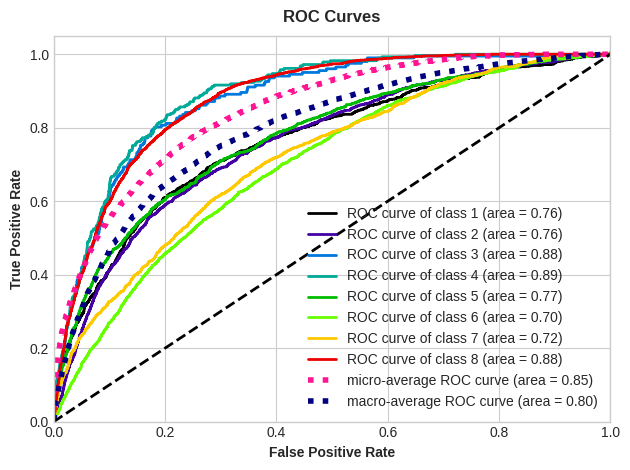

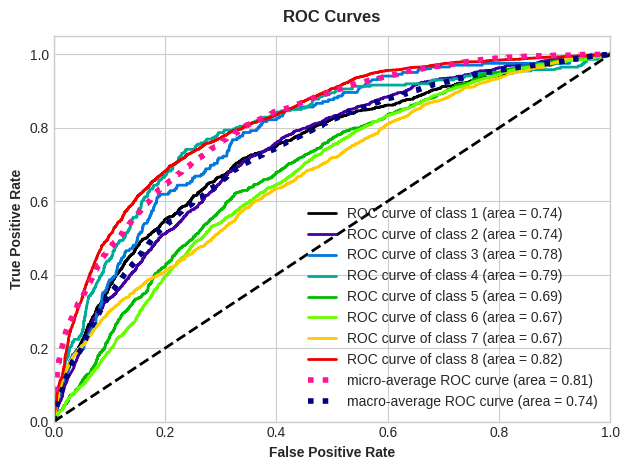

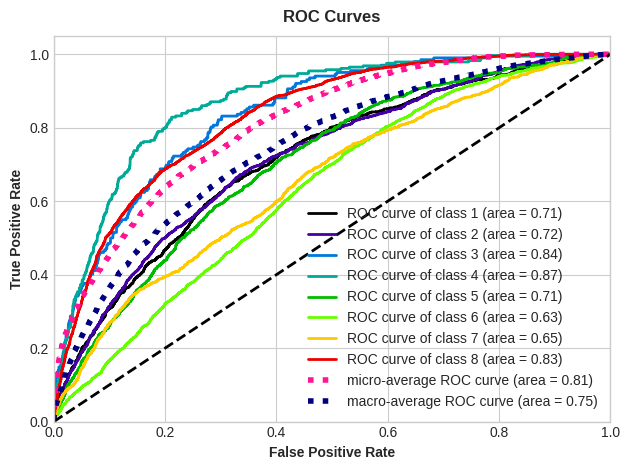

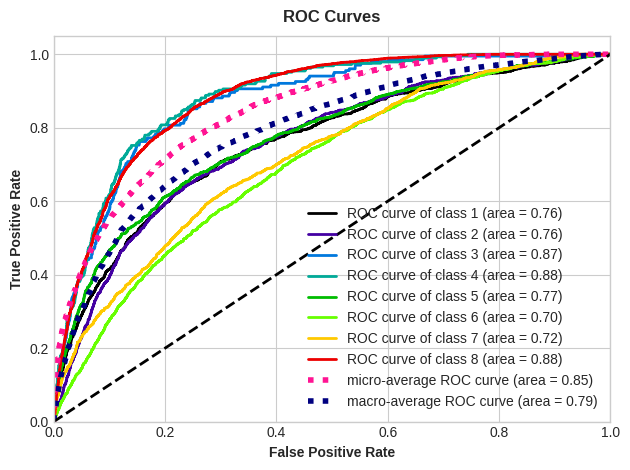

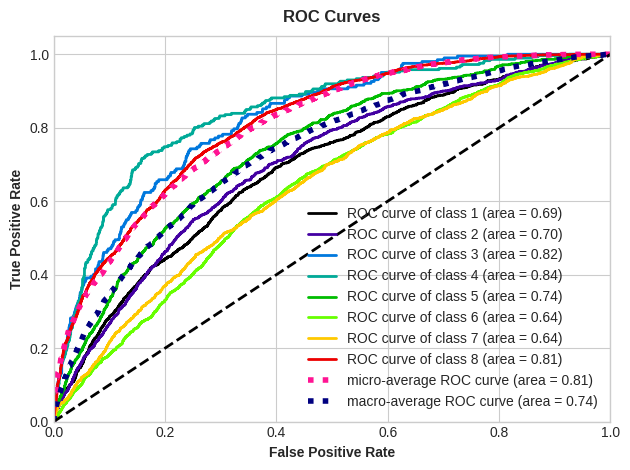

...

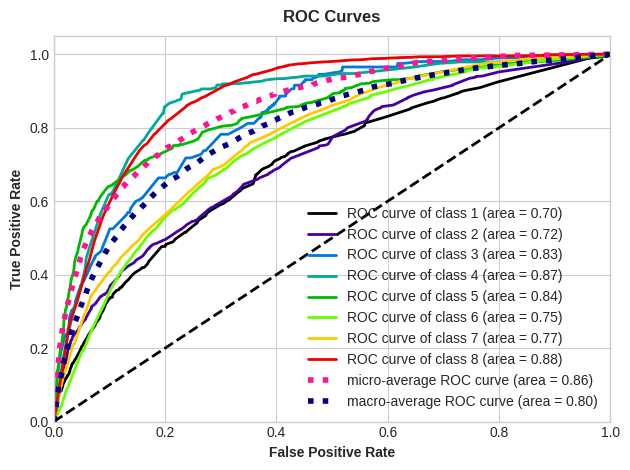

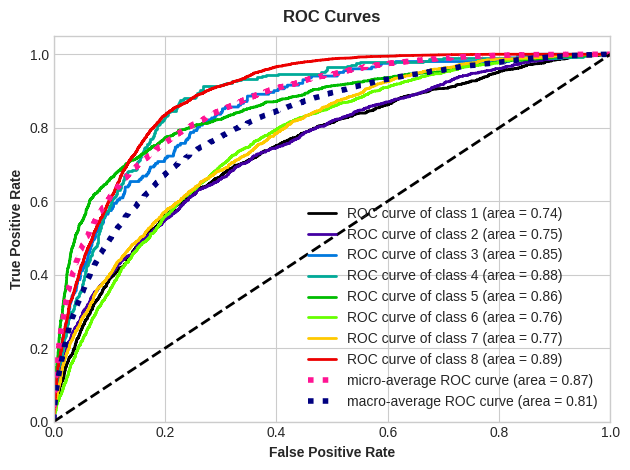

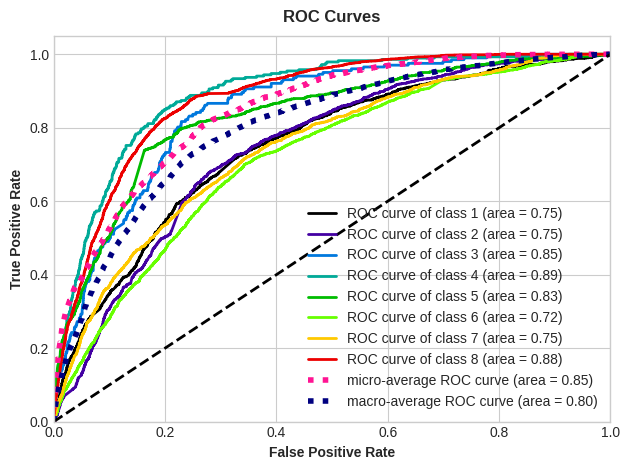

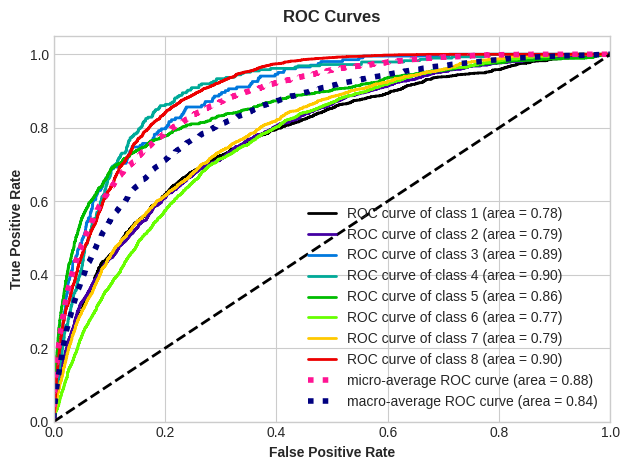

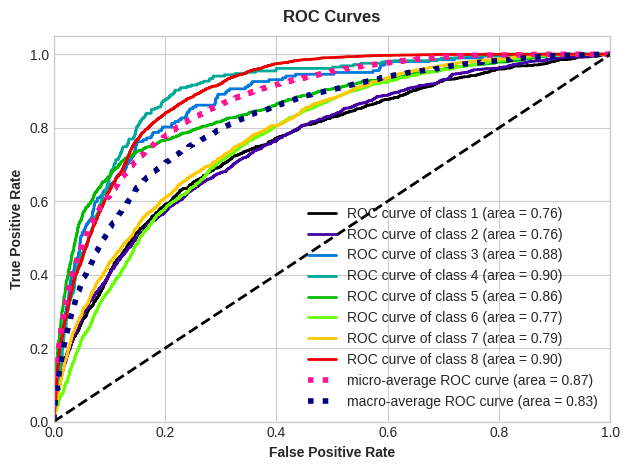

In [ ]:
from scikitplot.metrics import plot_roc, plot_confusion_matrix

# Plot Receiver Operating Characteristic (ROC) curves for each model to show TP rate vs FP rate

for y_val_predprobs in Valid_PredProbs:
    plot_roc(y_val, y_val_predprobs)

As shown in the charts above, each model exhibits a wide range of AUC values across classes, reflecting varying sensitivity and specificity
across the dataset. The two highest average AUC values were achieved by the gradient boosting classifiers (**model 11**: macro-average AUC=0.84, and **model 12**: macro-average AUC=0.83).

Both models performed best for predicting classes 3, 4, and 8, with high AUC scores (~0.9) in their ROC curves. They exhibit slightly reduced performance when classifying other classes.

### 5.1.2 Classification Reports (Precisions/Recalls/F1-Scores)

In [ ]:
# Print a Classification Report for each model to show Precision, Recall, F1-score, and Accuracy

for y_val_preds in Valid_Preds:
    print(classification_report(y_val, y_val_preds))

              precision    recall  f1-score   support

           1       0.40      0.28      0.33      1242
           2       0.38      0.22      0.28      1310
           3       0.56      0.02      0.05       202
           4       0.75      0.01      0.02       286
           5       0.39      0.31      0.35      1087
           6       0.36      0.39      0.37      2246
           7       0.42      0.23      0.29      1605
           8       0.58      0.90      0.71      3898

    accuracy                           0.48     11876
   macro avg       0.48      0.30      0.30     11876
weighted avg       0.46      0.48      0.44     11876

              precision    recall  f1-score   support

           1       0.31      0.28      0.30      1242
           2       0.32      0.18      0.23      1310
           3       0.21      0.07      0.11       202
           4       0.00      0.00      0.00       286
           5       0.00      0.00      0.00      1087
           6       0.28 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.26      0.11      0.15      1242
           2       0.24      0.19      0.21      1310
           3       0.22      0.07      0.10       202
           4       0.26      0.06      0.09       286
           5       0.26      0.21      0.23      1087
           6       0.29      0.26      0.27      2246
           7       0.28      0.06      0.10      1605
           8       0.49      0.87      0.63      3898

    accuracy                           0.40     11876
   macro avg       0.29      0.23      0.23     11876
weighted avg       0.34      0.40      0.34     11876

              precision    recall  f1-score   support

           1       0.30      0.29      0.29      1242
           2       0.28      0.20      0.23      1310
           3       0.19      0.03      0.05       202
           4       0.31      0.09      0.14       286
           5       0.30      0.22      0.25      1087
           6       0.31 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

The summary tables above show that each model has a broad range of precision and recall values for each class, indicating varying levels of accuracy across the dataset.

In terms of precision, each of the models display somewhat mediocre performance for each class, with the highest value consistently belonging to class 8. Each model also consistently shows very high recall for class 8, and poorer values against the other groups. The same trend can also be observed for F1-score, indicating that the models are strongly fitted towards predicting applicants in class 8 as we would expect (given that they represent the largest class in our dataset).

It is interesting to observe that, for class 3, **model 11**'s precision/recall/F1-score values are equal to 0, which means that it did not correctly predict any applicants for this risk rating. On the other hand, **model 12** indicated a precision 0.27, recall 0.05 and F1-score 0.08. However, as will be discussed further in the next section, this does not necessarily mean that model 11 is wholly inaccurate and should not be trusted altogether.

Finally, it’s important not to judge models solely on their precision, recall, or F1-scores. These metrics can be harsh and may highlight strong underfitting or overfitting since they evaluate accuracy in a "one vs. rest" manner. If the Response values were grouped into broader categories, such as Low/Med/High-risk, model performance might appear significantly better.

### 5.1.3 Confusion Matrices

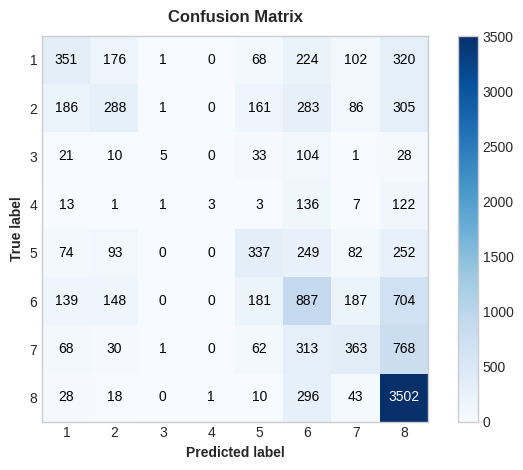

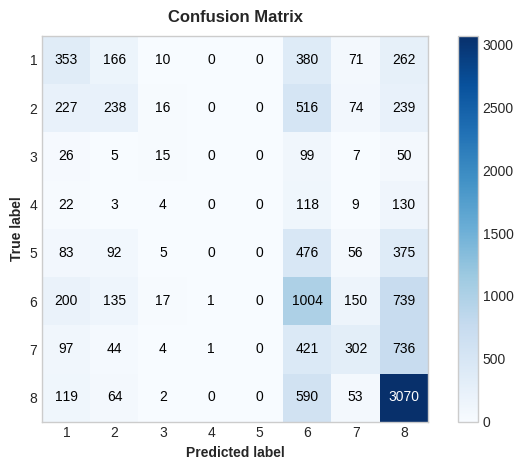

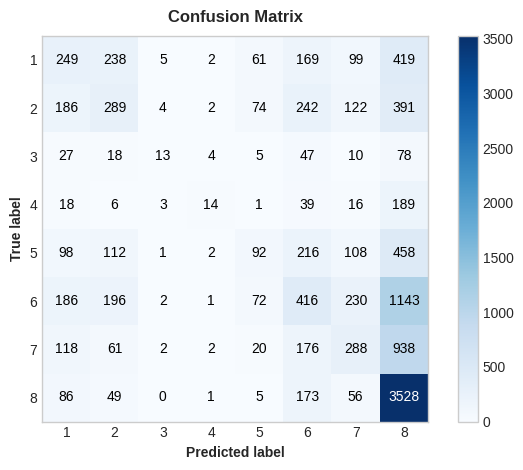

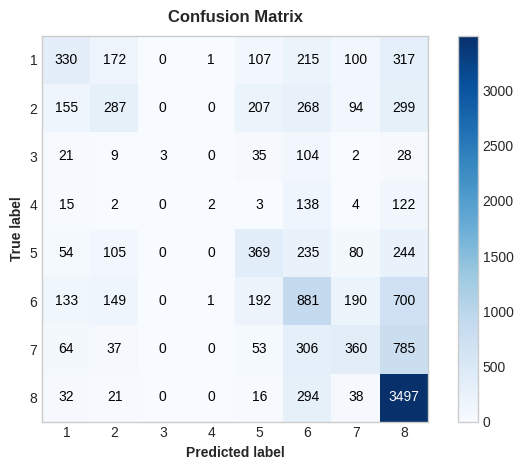

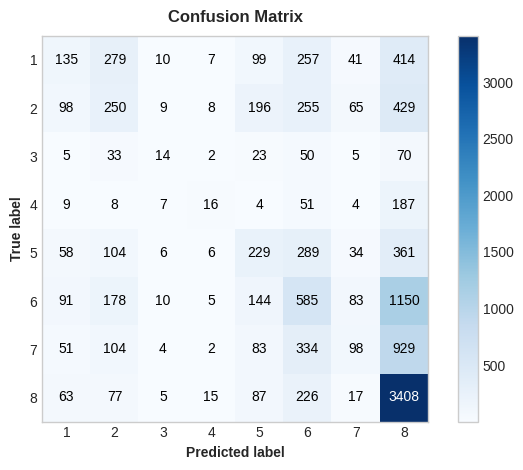

...

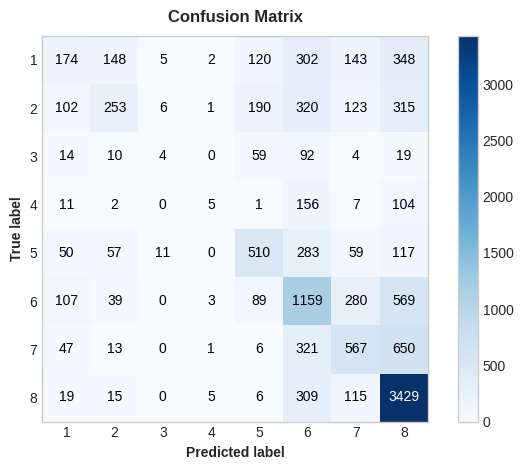

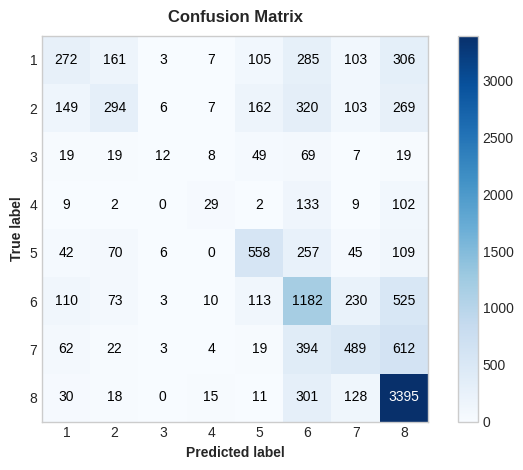

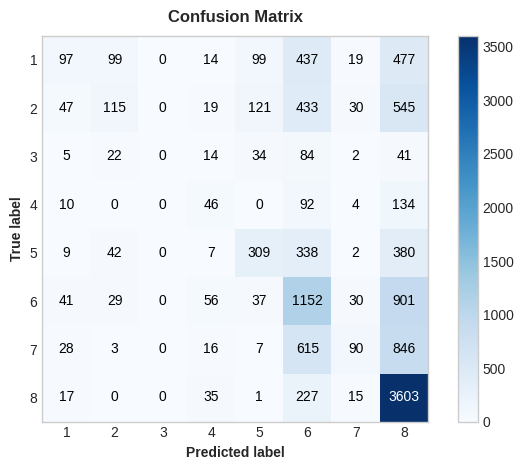

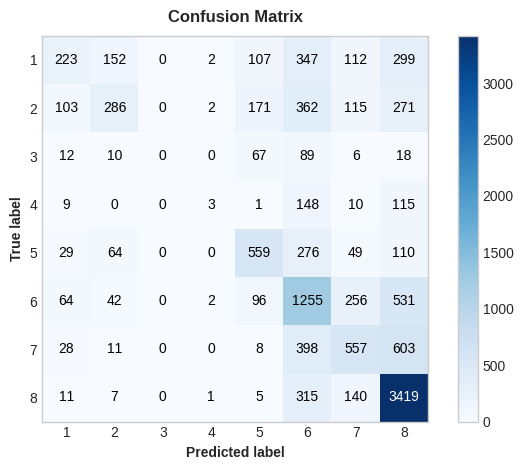

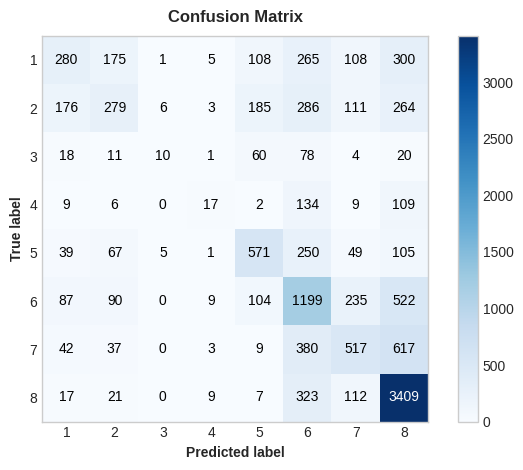

In [ ]:
# Plot a Confusion Matrix for each model to visualize True vs. False labels

for y_val_preds in Valid_Preds:
    plot_confusion_matrix(y_val, y_val_preds)

The confusion matrices above have been assembled in order to visualise how each model's predictions map to the true set of labels available in the test dataset. These plots help to illustrate as to whether the model has become overfitted to any particular classes in the dataset, or whether they remain sufficiently generalised and capable of sensibly classifying applicants.

From the plots above, most appear to be fairly well-fitted to the data, in that they are capable of replicating the distribution of Response values (shown earlier above in Step 1) reasonably well. We can also see that a majority of the missed cases are in fact relatively close to where they should be (e.g. predicted as class 8, was actually class 7). However, there are some notably underperforming models which appear to be highly overfitted towards predicting applicants as belonging to class 8 (which represents the largest proportion across all applicants in the dataset). The confusion matrix for **model 7** (SVC with sigmoid kernel) demonstrates this trait extremely well, which shows that only a tiny proportion of predictions were made in any other class apart from 8. **Models 3 and 5** (SVCs with linear and polynomial kernels, respectively) also demonstrate this trend to a lesser extent as well.

**Models 11 and 12**, on the other hand, appear to generalise reasonably well to the dataset, mimicking the distribution plot shown in Step 1. Furthermore, the only notable drawback of these models that can be observed is that they tend to predict some low-risk applicants (e.g. classes 1-2) as high-risk applicants (e.g. classes 6-8) with a higher than expected frequency - see the top-right corners of each plot. In terms of using either of these models in a real-world business scenario, this would only mean that more effort/time is potentially wasted on scrutinising low-risk applicants further before offering a policy, rather than treating high-risk applicants with a light touch and introducing unnecessary risk into the insurer's portfolio.

### 5.1.4 Balanced Accuracy Scores

Here, we calculate each model’s balanced accuracy score by comparing predictions to the known results in the validation dataset. This score is the arithmetic mean of the recalls for each class.

However, like previous metrics, this measure can be harsh because it uses a 'one-vs-rest' approach, which may not accurately reflect the challenge of classifying each applicant's exact rating in the validation dataset.

We can derive the balanced accuracy scores of each model as follows:

In [ ]:
BalancedAccScores = []

# Compute the balanced accuracy score for each model's predictions
for y_val_preds in Valid_Preds:
    BalancedAccScore = balanced_accuracy_score(y_val, y_val_preds)
    BalancedAccScores.append(BalancedAccScore)

# Gather all Balanced Accuracy scores into a single dictionary
BalancedAccScoreResults_y_val   = {'Model1_Calibrated': BalancedAccScores[0],
                                   'Model2_Calibrated': BalancedAccScores[1],
                                   'Model3_Calibrated': BalancedAccScores[2],
                                   'Model4_Calibrated': BalancedAccScores[3],
                                   'Model5_Calibrated': BalancedAccScores[4],
                                   'Model6_Calibrated': BalancedAccScores[5],
                                   'Model7_Calibrated': BalancedAccScores[6],
                                   'Model8_Calibrated': BalancedAccScores[7],
                                   'Model9_Calibrated': BalancedAccScores[8],
                                   'Model10_Calibrated': BalancedAccScores[9],
                                   'Model11_Calibrated': BalancedAccScores[10],
                                   'Model12_Calibrated': BalancedAccScores[11]}

# Identify the model with the highest Balanced Accuracy
Model_LowestBalancedAccScore_Valid = max(BalancedAccScoreResults_y_val, key=BalancedAccScoreResults_y_val.get)
print(Model_LowestBalancedAccScore_Valid)

Model9_Calibrated


## 5.2 Find Best Model

Evaluate and identify the best-performing model based on the discussed metrics

In the section above, we considered a variety of performance-based factors that are commonly involved in choosing the best model to use for generating a final set of predictions.

Based on the discussions above RE: ROC Curve/Confusion Matrix/Balanced Accuracy Score analyses, we select Model 12 (XGBClassifier) as the best performing model to be used for testing purposes.

In [ ]:
# Designate model 12 (XGBClassifier) as the top-performing model in the cohort
BestModel = Model12_Calibrated

## 5.3 Predict using final model (using test data)

Generate predictions/probability estimates using the best model (using test data)

Using the best performing model as determined above, we can now generate a set of test predictions which will be used to evaluate/review the model's performance on unseen data.

In [ ]:
# Use the best performing model to generate predictions (as probability estimates) on the test dataset.
BestModel_Test_PredProb = BestModel.predict_proba(X_test_L1reg)

## Convert the probability estimates into label-encoded predictions, then convert back to the original set of classes.
BestModel_Test_Preds = np.argmax(BestModel_Test_PredProb, axis=1)
BestModel_Test_Classes = BestModel.classes_
BestModel_Test_Preds = [BestModel_Test_Classes[i] for i in BestModel_Test_Preds]
BestModel_Test_Preds = le.inverse_transform(BestModel_Test_Preds)

## 5.4 Evaluate performance of final model (using test data)

In the section below, we will review how the selected model has performed in terms of classifying applicants into each Response group, based on the test dataset.

In [ ]:
# Revert test dataset's encoded labels (0-7) to original classes (1-8) for clearer performance evaluation
y_test = le.inverse_transform(y_test)

# Make a duplicate copy of the model's predicted labels
Test_Preds = BestModel_Test_Preds

# Create a duplicate of the model's prediction probabilities
Test_PredProbs = BestModel_Test_PredProb

### 5.4.1 ROC Curve

<Axes: title={'center': 'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

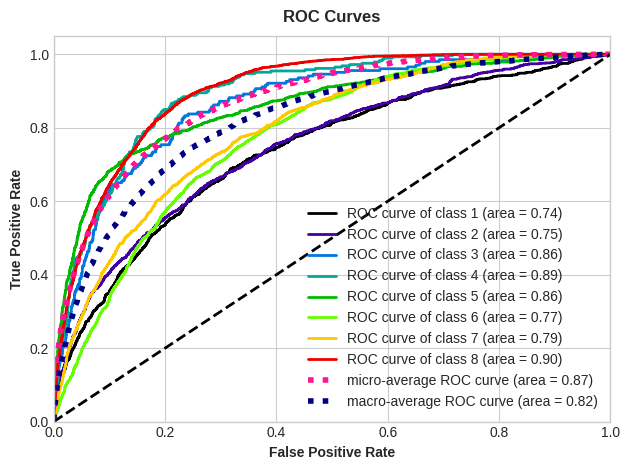

In [ ]:
# Plot the ROC curve to illustrate the selected model's performance - True Positive rate vs. False Positive rate
plot_roc(y_test, Test_PredProbs)

As illustrated in the chart above, the `XGBClassifier` model demonstrates a wide range of AUC values across different classes, reflecting varying levels of sensitivity and specificity throughout the dataset. Additionally, the model performs notably well in predicting classes 3, 4, and 8, as evidenced by high AUC scores (~0.9) in their ROC curves. This suggests that the model generalizes effectively, even with previously unseen data.

### 5.4.2 Classification Report (i.e. Precision/Recall/F1-Score)

In [ ]:
# Print a Classification Report for the selected model to show Precision, Recall, F1-score, and Accuracy

print(classification_report(y_test, Test_Preds))

              precision    recall  f1-score   support

           1       0.40      0.19      0.26      1241
           2       0.42      0.22      0.29      1310
           3       0.27      0.03      0.06       203
           4       0.35      0.07      0.11       286
           5       0.53      0.52      0.53      1086
           6       0.41      0.53      0.46      2247
           7       0.46      0.33      0.39      1606
           8       0.64      0.88      0.74      3898

    accuracy                           0.53     11877
   macro avg       0.43      0.35      0.35     11877
weighted avg       0.50      0.53      0.49     11877



The classification report highlights that the model exhibits a wide range of precision, recall, and F1-score values across different classes, reflecting varying degrees of accuracy throughout the dataset. This variability underscores the model's strong performance in the key Response groups. Notably, the model performs particularly well for class 8 applicants, as indicated by the higher precision, recall, and F1-score values for this class.

### 5.4.3 Confusion Matrix

<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

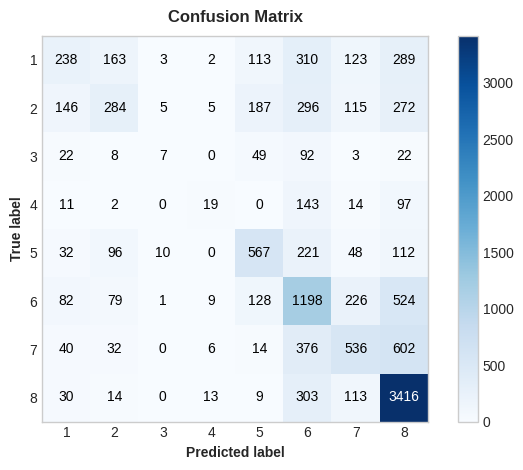

In [ ]:
# Plot a Confusion Matrix to visualize the selected model's performance - True labels versus False labels

plot_confusion_matrix(y_test, Test_Preds)

The confusion matrix indicates that the model's performance on the test dataset closely mirrors its performance during the earlier validation phase. Additionally, the model has effectively replicated the Response distribution identified in Step 1.

The off-diagonal hotspots, which signify notable misclassifications, were anticipated based on the previous model validation process. The key observation is that, apart from the higher-than-expected risk predictions in the top-right corner, the model demonstrates robust performance across a range of risk levels, effectively managing applicants with varying degrees of risk.

### 5.4.4 Balanced Accuracy Score

# Calculate the balanced accuracy score for the selected model using the test dataset.


In [ ]:
# Compute the balanced accuracy score for the selected model
BalancedAccScore_y_test = balanced_accuracy_score(y_test, Test_Preds)

print(BalancedAccScore_y_test)

0.3468551367113548


# 6. XAI

Evaluating the model's performance through the lens of "feature importance" and explainability.

In the section above, we considered how well the model has performed against a number of key metrics such as ROC-AUC scores and precisions/recalls. However, we also need to think about how the model's decisions/behaviour can be explained in a clear and consistent manner - this is important in a real-world scenario from both a legal and ethical perspective, as we are assessing the prospective risk levels of numerous applicants for life insurance policies. Agreeing/rejecting applicants on insufficient/incorrect grounds could otherwise lead to reputational/financial damages.

In this section, we will now consider:

* what features have the biggest impact on the `XGBClassifier` model's predictions, and
* how the `XGBClassifier` model has generated its predictions based on the values of the most important features.

## 6.1 Feature Importances

Firstly, we will take a look at the XGBClassifier a bit more closely, in order to understand what features the model values most highly.

In [ ]:
# Examine the feature importances of the XGBoost classifier

FeatureImportances_BestModel = BestModel.estimator.feature_importances_
print(FeatureImportances_BestModel)

[0.03071852 0.00643526 0.01189804 0.04943389 0.01821095 0.00449573
 0.00538691 0.02208213 0.03325504 0.01596296 0.00728304 0.01413486
 0.00766465 0.004864   0.00457755 0.01263332 0.01299413 0.00609502
 0.13119808 0.00642483 0.01129519 0.01367998 0.0037234  0.00468396
 0.01110481 0.0141161  0.00953209 0.14302751 0.00543216 0.01394896
 0.01512968 0.00560046 0.03314825 0.01020407 0.01248888 0.00492357
 0.00977467 0.03728448 0.00549354 0.09296282 0.06742027 0.01694823
 0.00587843 0.00598483 0.00456115 0.01524989 0.00491214 0.0038409
 0.00630035 0.00560034]


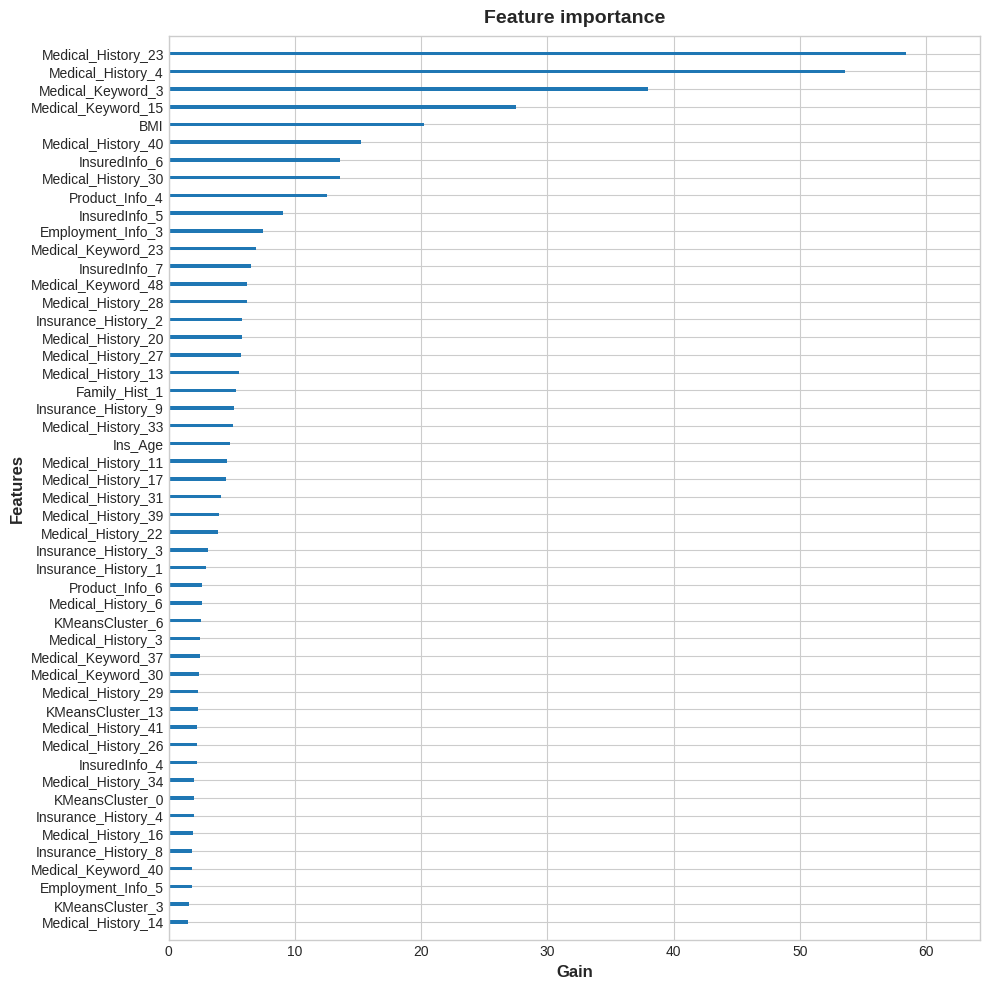

In [ ]:
from xgboost import plot_importance

# Create a Feature Importance plot for the selected model

fig, ax = plt.subplots(figsize=(10, 10))
plot_importance(BestModel.estimator,
                importance_type="gain",
                xlabel="Gain",
                show_values=False,
                ax=ax)
plt.show()

The Gain chart above demonstrates the relative contribution of each feature to the model - which is calculated by taking each feature's contribution for each decision tree that is used in the model.

This plot shows that the top five most important features (in terms of Gain/model contribution) are:

* `Medical_History_23`,
* `Medical_History_4`,
* `Medical_Keyword_3`,
* `Medical_Keyword_15`, and
* `BMI`.

Interestingly, these five features were also highly ranked within the Mutual Information score chart (see Step 7 earlier above), which lends some credibility to the view that these features may be closely involved in governing what risk rating an applicant should be assigned.

The bottom five (i.e. least important) features in terms of Gain are:

* `Medical_History_34`,
* `Product_Info_2_E1`,
* `KMeansCluster_4`,
* `Insurance_History_8`, and
* `Medical_History_41`.

Four of these five features were also poorly ranked within the MI score chart shown in Step 7, however KMeansCluster_4 was instead moderately ranked (residing within the top 15 features). This implies that, whilst `KMeansCluster_4` was initially deemed to show some potential in terms of predictive power, the `XGBClassifier` does not value this feature as highly when generating predictions for the test dataset.

## 6.2 Permutation Importance

Next, we can review how the model handles random column-wise reordering of data - performing what is more commonly known as permutation importance analysis - to see which features increase the volatility of our model's predictions upon random shuffling (and hence, which features the model relies on most heavily for generating predictions).

To do this, we will calculate the permutation importance weights using our test dataset, as shown below:

# Downgrade scikit-learn and install eli5
!pip install --upgrade scikit-learn
import sklearn
print(sklearn.__version__)
#!pip install --upgrade seaborn
#!pip install scikit-learn==1.2.2
#!pip install scikit-learn==0.22.2.post1
!pip install --upgrade eli5
import eli5
print(eli5.__version__)

from eli5.sklearn import PermutationImportance
from eli5 import show_weights

# Compute the Permutation Importances for the selected model

perm = PermutationImportance(BestModel.estimator, random_state=0).fit(X_test_L1reg, y_test)

# Display the Permutation Importance weights (and errors) for the top 20 features

show_weights(perm, feature_names=X_test_L1reg.columns.tolist())


The values towards the top of the table are the most important, and those towards the bottom matter the least.

Here, the top five features that appear to have the strongest impact on the model's performance/accuracy when shuffled randomly are:

* `Medical_Keyword_3`
* `Medical_History_39`
* `InsuredInfo_5`
* `Product_Info_2_D1`
* `Medical_History_17`

Most of these features were also highlighted as having the highest feature importances in the section above. Interestingly, `Medical_History_23` (the highest scored feature in terms of Feature Importance) does not show up in the top 20 permutation importance weightings - this could imply that this feature does not have any meaningful causational relationship with Response, and has unintentionally been given higher importance due to possible overfitting.

More information on the topic of comparing tree-based feature importances against permutation importances can be found at the following page: [Relation to impurity-based importance in trees - scikit-learn](https://scikit-learn.org/stable/modules/permutation_importance.html#relation-to-impurity-based-importance-in-trees).

### 6.2.1 SHAP Values

The SHAP framework (acronym derived from **SH**apley **A**dditive ex**P**lanations) is excellent for breaking down predictions in order to show the impact of features. This is especially useful for when we want to explain how/why we have classified certain applicants who may have demonstrated high/low risk potential.

The advantage that this approach has over calculating permutation importances alone, is that SHAP values can express whether a feature has a broad effect across all predictions, or whether its effect is more localised for a handful of predictions and negligible in general; permutation importance simply captures the "average" impact of each feature.

Here, we will calculate the SHAP values for the test dataset to visualise how the XGBClassifier model has behaved, based on the values of the most important features.

In [ ]:
!pip install shap

In [ ]:
import shap

# from above...
### Designate model 12 (XGBClassifier) as the best performing model of the cohort.
### BestModel = Model12_Calibrated

# Initialise the explainer object in order to calculate SHAP values.
explainer = shap.TreeExplainer(BestModel.estimator)

# Compute SHAP values for the entire test dataset
shap_values = explainer.shap_values(X_test_L1reg)

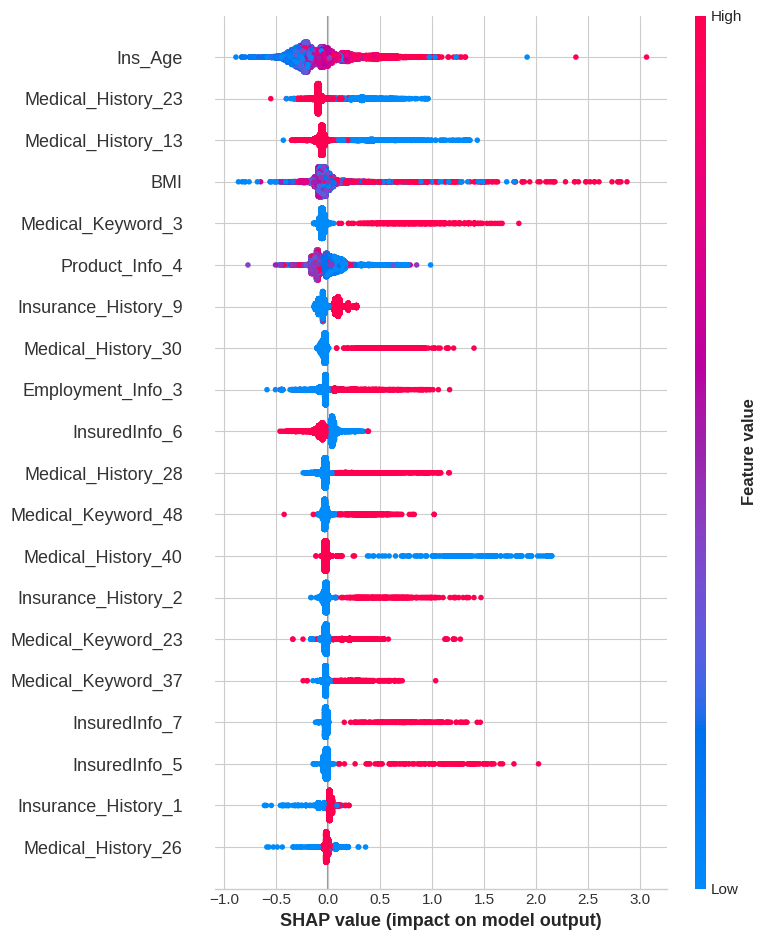

In [ ]:
# Generate a summary plot of the SHAP values
# shap.summary_plot(shap_values, X_test_L1reg)

# Select the SHAP values for the first class/cluster if necessary
shap_values_class0 = shap_values[:,:,0]

# Generate a summary plot for SHAP values of the first class/cluster
shap.summary_plot(shap_values_class0, X_test_L1reg)

The SHAP summary plot above offers a comprehensive view of feature importance for the top 20 features, as determined by the SHAP framework. Each dot's color indicates whether the feature value was high or low for that data row, while the horizontal position of the dot shows whether the feature's effect resulted in a higher (towards 8) or lower (towards 1) prediction.

For instance, the `BMI` feature clearly expresses that as the BMI of the applicant increases, then their predicted risk rating also increases strongly. As another example, `Product_Info_2_A6` - i.e. whether the applicant's selection for `Product_Info_2` is equal to *A6* - shows a clear negative correlation with the predicted risk rating.

However, there are also a couple of other interesting cases to note - for example, `Ins_Age` shows a negative correlation when away from the baseline value (class 5) but is more mixed as the value approaches the baseline. `Family_Hist_4` appears to show a mixed effect on the value of `Response` regardless of the choice of class.

### 6.2.2 SHAP Dependence Plots

We can also review individual features more closely, by creating SHAP dependence contribution plots.

These are extremely helpful for displaying what the distribution of effects is, and linking this to a model's predictions.

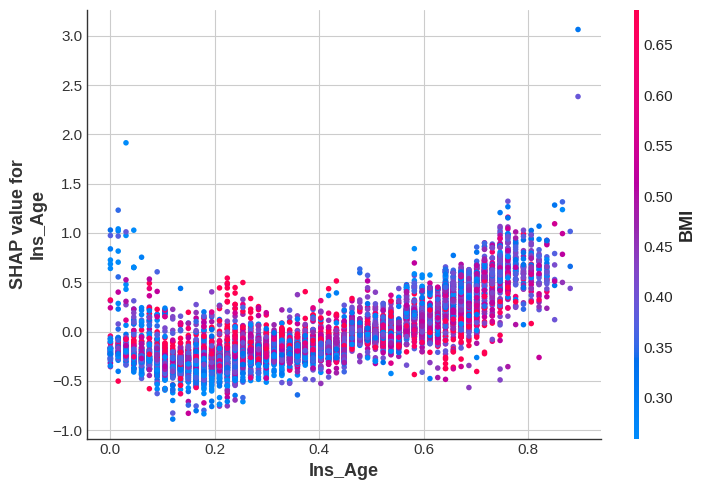

In [ ]:
# Create a SHAP Dependence plot of the 2nd highest ranked feature - "Product_Info_4".

shap.dependence_plot("rank(0)", shap_values[:, :, 0], X_test_L1reg)

Here, we have generated a SHAP dependence contribution plot for `BMI` as a function of `Ins_Age`. The horizontal location of each dot represents the actual value from the test dataset, and the vertical location represents the impact (on the prediction) of having that value.

The shape of the plot indicates that, once BMI exceeds 0.7, the distribution slopes sharply upwards - inferring that the likelihood of being assigned to a higher risk rating greatly increases after this point. However, as `BMI` approaches 1.0, the distribution then quickly slopes downwards. The drastic increase in the distribution's spread as the feature value approaches 1.0 implies that other features begin to interact more strongly with `BMI` at this upper limit.

Upon reviewing the interaction between `BMI` and `Ins_Age` more closely at this upper limit, it appears that on average, younger applicants with high BMIs tend to be assigned higher risk ratings by the model than high-BMI applicants that are more elderly, however more data would be required in order to validate this hypothesis, before any relevant business decisions could be made.

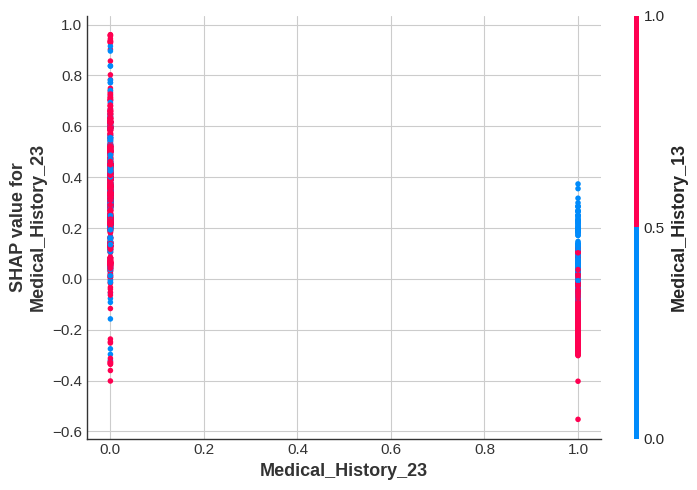

In [ ]:
shap.dependence_plot("rank(1)", shap_values[:, :, 0], X_test_L1reg)

Here, we generate a SHAP dependence contribution plot to analyze the influence of Medical_History_23 on the model's risk classification predictions, with Medical_History_13 as the interaction feature.

The horizontal axis represents the values of Medical_History_23, while vertical axis displays the SHAP values for Medical_History_13. Positive SHAP values indicate that the corresponding Medical_History_23 values increase the likelihood of classification into a certain risk category, while negative SHAP values suggest a decrease. SHAP values near zero indicate minimal impact.

The color gradient represents Medical_History_13 values, from blue (low values) to red (high values), providing context on how it interacts with Medical_History_23.

Key observations include:

Binary Nature of Medical_History_23: The feature is binary, taking values of either 0 or 1.
Medical_History_23 = 0: SHAP values are widely spead, indicating with Medical_13 influencing this effect.

Medical_History_23 = 1: SHAP values show a fairly wide range, suggesting a significant and variable influence on the risk classification. The color spread indicates that Medical_History_13 also plays a crucial role in modifying this impact.

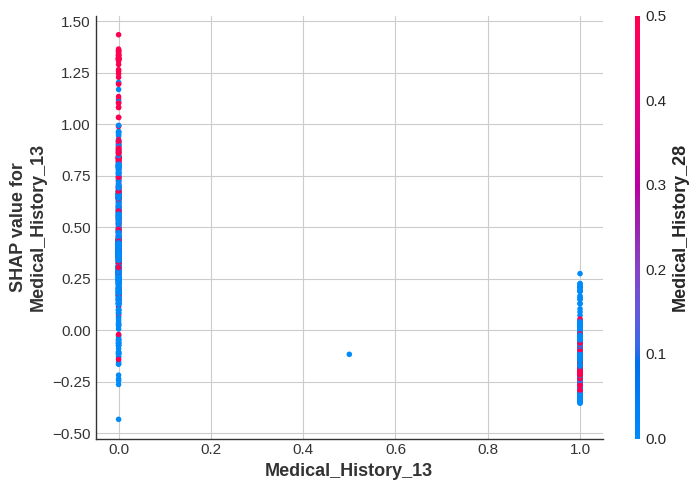

In [ ]:
shap.dependence_plot("rank(2)", shap_values[:, :, 0], X_test_L1reg)

Below SHAP dependence contribution plot to analyze the influence of BMI, as a function of Medical_History_16, on the model's risk classification predictions.

The horizontal axis displays BMI values from the dataset, and the vertical axis represents the SHAP values corresponding to BMI. Positive SHAP values indicate that the corresponding BMI values increase the likelihood of being classified into a certain risk category, whereas negative SHAP values suggest a decrease. A SHAP value near zero indicates that BMI has little to no impact on the classification.

The color gradient represents the values of Medical_History_16, ranging from blue (low values) to red (high values). This additional dimension provides context on how Medical_History_16 interacts with BMI to influence risk classification.

Key observations include:

For very low BMI values (below 0.3), the SHAP values are highly variable, indicating that the impact of low BMI on risk classification is influenced by Medical_History_16.
For mid-range BMI values (around 0.5), the SHAP values are generally close to zero, suggesting that BMI has a neutral effect on risk classification in this range.
For very high BMI values (above 0.8), the SHAP values are predominantly positive, indicating that high BMI increases the likelihood of certain risk classifications. The spread of colors in this range suggests that Medical_History_16 significantly interacts with BMI to modify the risk classification.
This plot demonstrates how BMI influences the model’s risk classification predictions, with Medical_History_16 providing critical context for understanding these interactions.

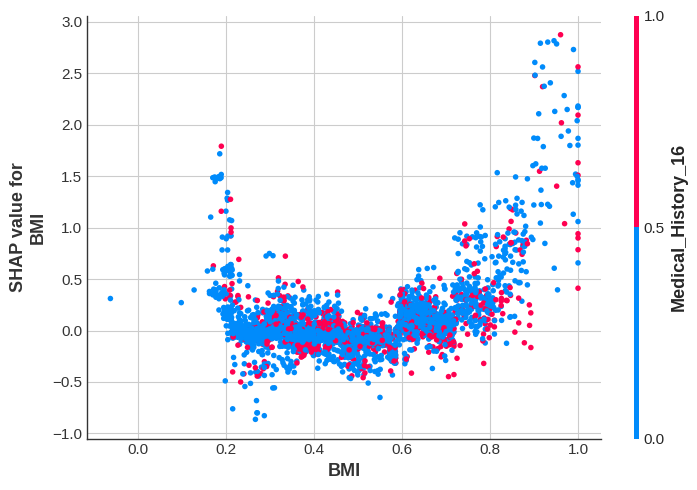

In [ ]:
shap.dependence_plot("rank(3)", shap_values[:, :, 0], X_test_L1reg)

### SHAP Dependence Plot (BMI vs Medical_History_16)

Here we generated a SHAP dependence contribution plot to analyze the influence of BMI, as a function of Medical_History_16, on the model's risk classification predictions.

The horizontal axis represents BMI values from the dataset, while the vertical axis shows the SHAP values for BMI. Positive SHAP values indicate that the corresponding BMI values increase the likelihood of being classified into a certain risk category, whereas negative SHAP values suggest a decrease. A SHAP value near zero indicates that BMI has little to no impact on the classification.

The color gradient represents the values of Medical_History_16, ranging from blue (low values) to red (high values). This additional dimension provides context on how Medical_History_16 interacts with BMI to influence risk classification.

Key observations include:
- For very low BMI values (below 0.3), the SHAP values are highly variable, indicating that the impact of low BMI on risk classification is influenced by Medical_History_16.
- For mid-range BMI values (around 0.5), the SHAP values are generally close to zero, suggesting that BMI has a neutral effect on risk classification in this range.
- For very high BMI values (above 0.8), the SHAP values are predominantly positive, indicating that high BMI increases the likelihood of certain risk classifications. The spread of colors in this range suggests that Medical_History_16 significantly interacts with BMI to modify the risk classification.

This plot demonstrates how BMI influences the model’s risk classification predictions, with Medical_History_16 providing critical context for understanding these interactions.

# Conclusion

## Areas of Improvement¶


Whilst this project has aimed to showcase an implementation of the DS/ML workflow in an insurance-based context, it does not aim to provide a comprehensive "A-Z" approach on how to apply ML techniques for the risk classification of insurance applicants. There are, however, a couple of areas where this project could be improved.

For example, in terms of **model performance**:

* The aim of this project has been to establish an ML model that is capable of accurately predicting risk ratings (split between 8 different categories) for insurance applicants. However, as this involves working with a fairly complex dataset with a wide range of features, the model has not been fully able to capture every single nuance within the dataset, and has instead generalised to predict across the entire distribution to a reasonable degree of accuracy. Therefore, the model may actually prove to be more useful for business purposes if it was instead assigned to predict based on broader sets of risk bandings (e.g. classes 1-3 could be grouped together into Low, classes 4-6 into Medium, and classes 7-9 into High). Then, further refinement of these initial groupings could be made by assembling another layer of classifiers that are specifically trained on datasets that are representative of each risk banding (e.g. another model specifically trained for performing further segmentation of low-risk applicants).

In terms of **feature engineering**:

* As this dataset's feature names have been anonymised, it has not been possible to incorporate "business logic"-driven feature engineering directly into the model preparation process. However, potential interactions between features could still be studied further during EDA in order to produce new features that take advantage of statistical correlations within the dataset. With the assistance of an "unanonymised" dataset as well as the input of subject matter expertise, it may be possible to create more predictive features and validate them for use in production.

Lastly, in terms of **feature selection**:

* More stringent and quantitative-based approaches could have been used, in order to combine the methods employed for selecting the list of features that would be supplied to each model during the training process. For clarity, whilst we used Mutual Information/Variance Inflation Factor/Principal Component analysis techniques to display how the importance of each feature varied throughout the dataset, we only relied on Lasso regularisation in order to produce the final cut of selected features. It may be worth considering the use of a "voting system" in order to select features based on how they are ranked across each of the techniques used, so that one technique alone does not provide a final view.

# 8. Unsupervised Methods

In this section we apply unsupervised methods to the dataset resulting from the Data Preparation section, which per below has 32, 62850 samples (life insurance applications) and 50 features (dimensions)

Here, as an initial visualisation we create a scatter plot taking a random 1000 samples from the data and using the first 10 feature dimensions, with colours corresponding to the 8 risk classifications.Although permitting an initial impression of the data, this approach is clearly insufficient for these data.

## 8.1 Pair Plots

In [ ]:
print(X_train_L1reg.shape)
print(y_train.shape)

(35628, 50)
(35628,)


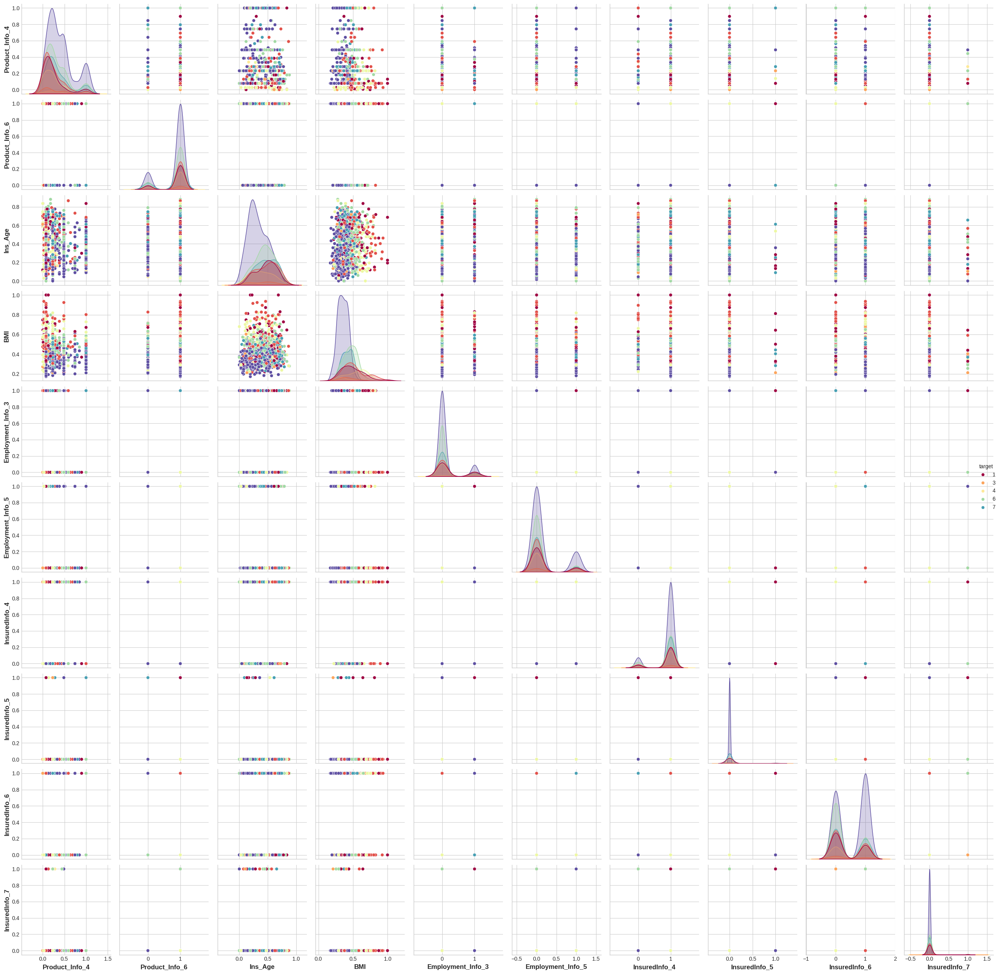

CPU times: user 1min 12s, sys: 827 ms, total: 1min 13s
Wall time: 1min 14s


In [ ]:
%%time
# Sampling a subset of the data
sampled_data = X_train_L1reg.sample(n=1000, random_state=42)
# Add y to the sample df so we can plot the colours of the target variable
sampled_data['target'] = y_train[sampled_data.index]  # Assuming y_train is the target variable
# Creating the pairplot for the first 10 dimensions with the sampled data
# sns.pairplot(sampled_data.iloc[:, :10], hue='target', palette='Spectral')
sns.pairplot(sampled_data.iloc[:, :10].join(sampled_data['target']), hue='target', palette='Spectral')
plt.show()

## 8.2 Initial Visualisation - 2d

In [ ]:
!pip install umap-learn

In [ ]:
import umap

Here, for initial visualisation, we reduce the data to 2-dimensions using UMAP. Ultimately, we will aim to cluster the data in high dimensional space and then visualise the result of that clustering. First, however, to help frame what follows, we simple view the data coloured by the risk category that each data point represents using a different colour for each classification.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


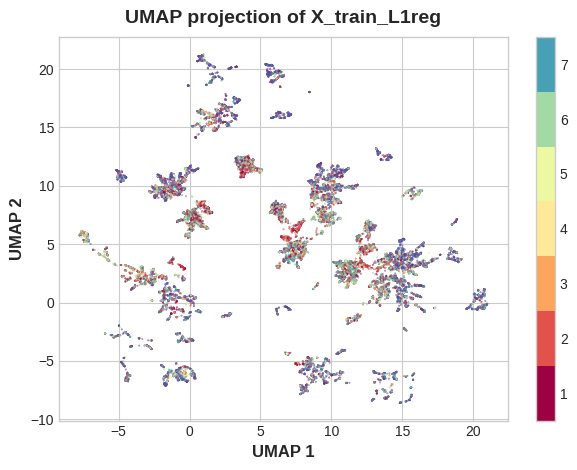

In [ ]:
# Assuming X_train_L1reg and y_train are already defined
standard_embedding = umap.UMAP(random_state=42).fit_transform(X_train_L1reg)

plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=y_train.astype(int), s=0.1, cmap='Spectral')
plt.colorbar(boundaries=np.arange(y_train.min(), y_train.max()+1)-0.5).set_ticks(np.arange(y_train.min(), y_train.max()))
plt.title('UMAP projection of X_train_L1reg')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

Per above but sampling 1000 application records.

In [ ]:
X_train_L1reg_sampled = X_train_L1reg.sample(n=1000, random_state=42)
# Add y to the sample df so we can plot the colours of the target variable
y_train_L1reg_sampled = y_train[X_train_L1reg_sampled.index] # Assuming y is the target variable

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


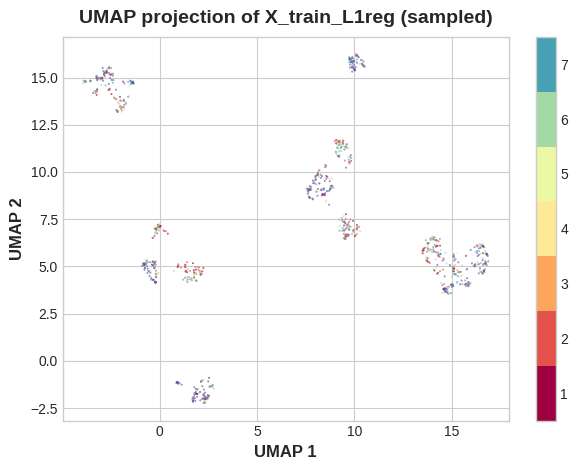

In [ ]:
# Assuming X_train_L1reg and y_train are already defined
standard_embedding_sampled = umap.UMAP(random_state=42).fit_transform(X_train_L1reg_sampled)

plt.scatter(standard_embedding_sampled[:, 0], standard_embedding_sampled[:, 1], c=y_train_L1reg_sampled.astype(int), s=0.1, cmap='Spectral')
plt.colorbar(boundaries=np.arange(y_train_L1reg_sampled.min(), y_train_L1reg_sampled.max()+1)-0.5).set_ticks(np.arange(y_train_L1reg_sampled.min(), y_train_L1reg_sampled.max()))
plt.title('UMAP projection of X_train_L1reg (sampled)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

## 8.3 k-Means Clustering

Here, we cluster the data using traditional k-Means choosing k, the number of clusters to match the number of the target `Response` attribute risk categories (8). Thus, we provide the same number of clusters we are looking for.

In [ ]:
import sklearn.cluster as cluster

kmeans_labels = cluster.KMeans(n_clusters=10).fit_predict(X_train_L1reg)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  self._algorithm = self.algorithm


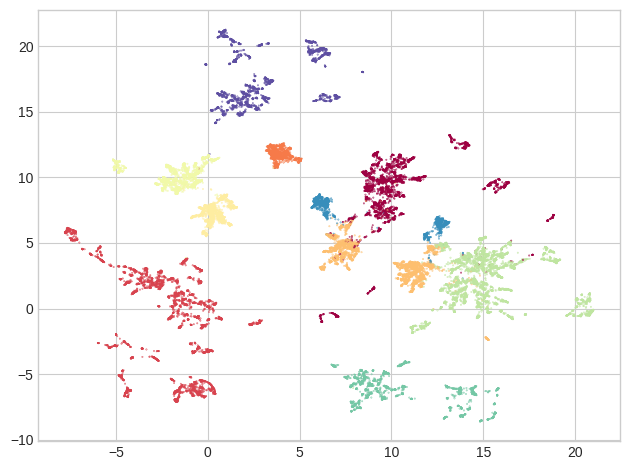

In [ ]:
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=kmeans_labels, s=0.1, cmap='Spectral');

The results show that the clusters are not tightly coalesced there is some potential as the colours are broadly associated with identifiable clusters in many cases.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  self._algorithm = self.algorithm


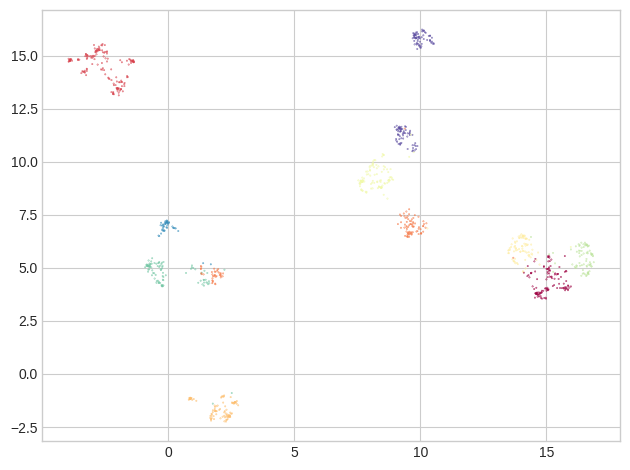

In [ ]:
kmeans_labels_sampled = cluster.KMeans(n_clusters=10).fit_predict(X_train_L1reg_sampled)
plt.scatter(standard_embedding_sampled[:, 0], standard_embedding_sampled[:, 1], c=kmeans_labels_sampled, s=0.1, cmap='Spectral');

The results show that the clusters are not tightly coalesced, there appears to be potential as the colours are generally associated with identifiable clusters in many cases. Multiple clusters are evident, a few dense or moderately dense, and clusters are well-separated. Fig. below shows the same k-Means drawn from 1000 samples and indeed shows the same.

In [ ]:
# Verification check
print(y_train.shape)
print(X_train_L1reg.shape)

(35628,)
(35628, 50)


In [ ]:
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train, kmeans_labels)
ami = adjusted_mutual_info_score(y_train, kmeans_labels)

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): 0.033577714143006226
Adjusted Mutual Information (AMI) Score: 0.05106085818583003


Evaluating the k-means clustering results, using the Adjusted Rand Index (ARI) and Adjusted Mutual Information (AMI) Score, indicated:

1. **Adjusted Rand Index (ARI): 0.0336**
   - This score is quite low, suggesting that the clustering does not closely match the true class labels. It indicates poor agreement between the clusters and the ground truth.

2. **Adjusted Mutual Information (AMI) Score: 0.0511**
   - Similarly, this low AMI score indicates a weak mutual information between the clustering and the true class labels. It suggests that the clusters do not capture much of the information about the actual classes.

In summary, both the ARI and AMI scores suggest that the k-means clustering does not perform well in identifying the true underlying structure of the data. This suggests that k-means clustering does not perform well in identifying the true underlying structure of the data, so we will investigate more advanced clustering methods.

## 8.4 HDBSCAN

In [ ]:
!pip install hdbscan
import hdbscan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 16.5 MB/s eta 0:00:00
  Attempting uninstall: cython
    Found existing installation: Cython 3.0.10
    Uninstalling Cython-3.0.10:
      Successfully uninstalled Cython-3.0.10


Before proceeding with HDBSCAN, for performance purposes, it can often be useful to reduce the dimensionality to around 50 or less, however, since we are already around this level through feature engineering alone we can omit this step.

One of the features of HDBSCAN is that it can refuse to cluster some points and classify them as “noise”. To visualize this aspect we will colour points that were classified as noise grey, and then colour the remaining points according to the cluster membership.

In [ ]:
#lowd_mnist = PCA().fit_transform(mnisX_train_L1reg)
hdbscan_labels = hdbscan.HDBSCAN(min_samples=10, min_cluster_size=500).fit_predict(X_train_L1reg)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


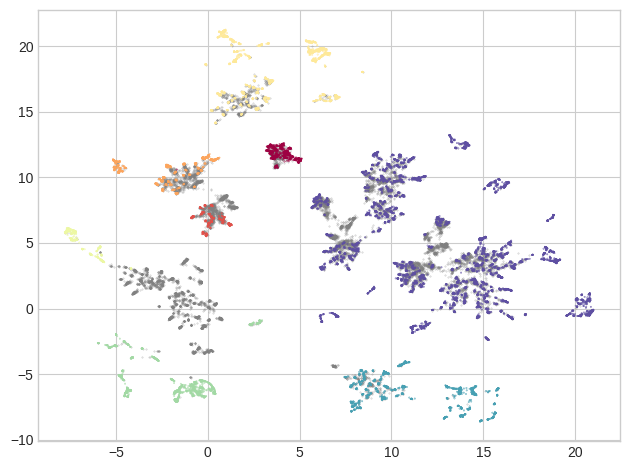

In [ ]:
clustered = (hdbscan_labels >= 0)
plt.scatter(standard_embedding[~clustered, 0],
            standard_embedding[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(standard_embedding[clustered, 0],
            standard_embedding[clustered, 1],
            c=hdbscan_labels[clustered],
            s=0.1,
            cmap='Spectral');

In [ ]:
hdbscan_labels_sampled = hdbscan.HDBSCAN(min_samples=10, min_cluster_size=500).fit_predict(X_train_L1reg_sampled)

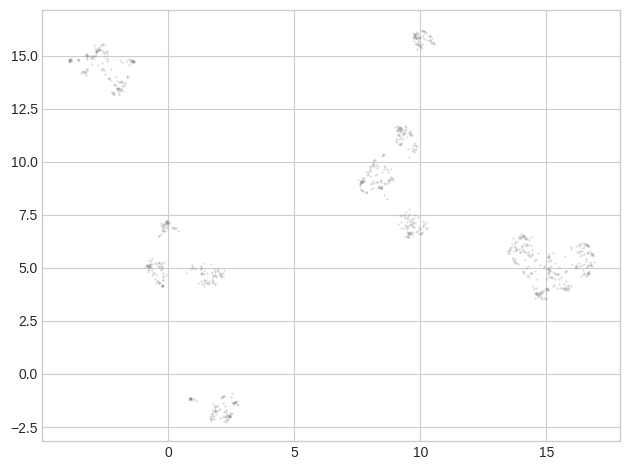

In [ ]:
clustered_sampled = (hdbscan_labels_sampled >= 0)
plt.scatter(standard_embedding_sampled[~clustered_sampled, 0],
            standard_embedding_sampled[~clustered_sampled, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(standard_embedding_sampled[clustered_sampled, 0],
            standard_embedding_sampled[clustered_sampled, 1],
            c=hdbscan_labels_sampled[clustered_sampled],
            s=0.1,
            cmap='Spectral');

In [ ]:
# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train, hdbscan_labels)
ami = adjusted_mutual_info_score(y_train, hdbscan_labels)

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): -0.013905530529543903
Adjusted Mutual Information (AMI) Score: 0.041957851216408465


In [ ]:
clustered = (hdbscan_labels >= 0)

# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train[clustered], hdbscan_labels[clustered])
ami = adjusted_mutual_info_score(y_train[clustered], hdbscan_labels[clustered])

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): -0.007338294010795304
Adjusted Mutual Information (AMI) Score: 0.03754900907033618


Similar to k-Means, the ARI and AMI score are very poor even when the cluster representing noise is omitted.

In [ ]:
np.sum(clustered) / X_train_L1reg.shape[0]

0.5306781183338947

The challenge here is that HDBSCAN, as a density-based clustering algorithm, struggles with the curse of dimensionality; high-dimensional data require more samples to effectively represent density. By further reducing the dimensionality, we could enhance density visibility and facilitate more effective clustering by HDBSCAN. However, applying PCA for this reduction poses issues. Although PCA can reduce the 50 dimensions while preserving much of the data's variance, further reduction would significantly degrade performance due to PCA's linear nature. Therefore, more robust manifold learning is required according to \cite{sainburg2021parametric-umap}, which is where UMAP becomes beneficial.

## 8.5 UMAP

### 8.5.1 UMAP enhanced clustering (with HDBSCAN) - 2D

Our objective is to utilize UMAP to execute non-linear manifold-aware dimensionality reduction, enabling us to reduce the dataset to a number of dimensions low enough for a density-based clustering algorithm to function effectively. A key benefit of using UMAP is that it allows reduction to dimensions beyond just two – for instance, we can reduce to say 10 dimensions since the aim is clustering rather than visualisation, with UMAP imposing minimal performance overhead.

The challenge we have here is the complexity of the Prudential dataset and our requirement to ideally be able to reduce to two or three dimensions for purposes of visualisation and interaction by users (underwriters).

Here, we comment on setting parameters on the UMAP algorithm. When applying UMAP for dimensionality reduction, we need to choose different parameters than when using it for visualisation. Firstly, a higher \texttt{n\_neighbors} value is advisable since smaller values will emphasise very local structures and are more likely to generate detailed cluster patterns that may be influenced by data noise rather than genuine clusters. For this purpose, we will double the default value from 15 to 30. Furthermore, it is favourable to set \texttt{min\_dist} to a very low value. Because we aim to densely pack points together, a low value will facilitate this and also create clearer separations between clusters. Hence, we will set \texttt{min\_dist} to 0. \citep{mcinnes2018umap-manual}

In [ ]:
clusterable_embedding_2d = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(X_train_L1reg)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


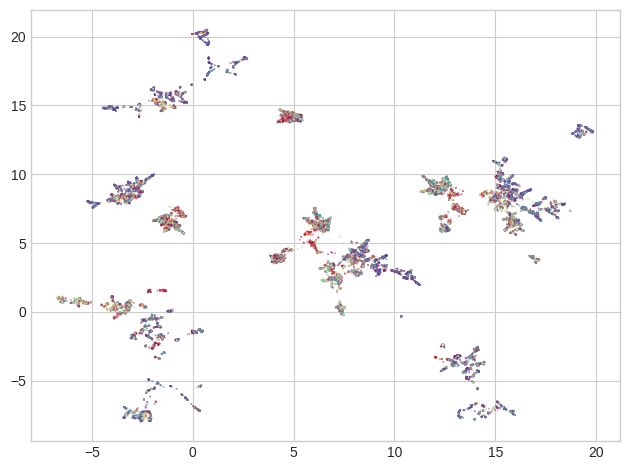

In [ ]:
plt.scatter(clusterable_embedding_2d[:, 0], clusterable_embedding_2d[:, 1],
            c=y_train, s=0.1, cmap='Spectral')

As can be seen from above we still have the general global structure, but points are slightly more densely packed together within clusters, and consequently we can see larger gaps between the clusters. However, this embedding was for clustering purposes only, so next we revert to the original embedding for visualisation purposes.

In [ ]:
labels_ensemble_2d = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500,
).fit_predict(clusterable_embedding_2d)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


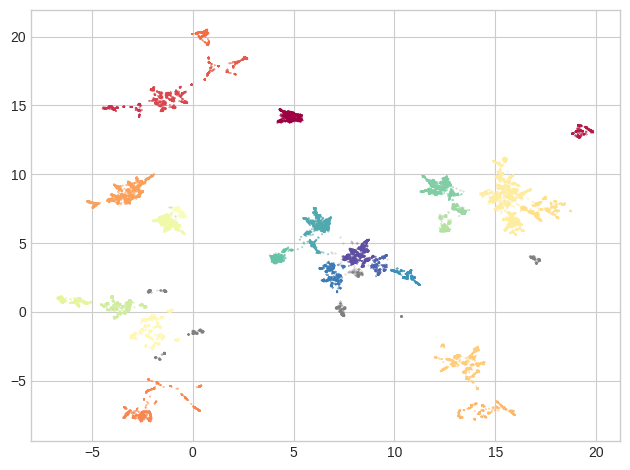

In [ ]:
clustered_ensemble_2d = (labels_ensemble_2d >= 0)
plt.scatter(clusterable_embedding_2d[~clustered_ensemble_2d, 0],
            clusterable_embedding_2d[~clustered_ensemble_2d, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(clusterable_embedding_2d[clustered_ensemble_2d, 0],
            clusterable_embedding_2d[clustered_ensemble_2d, 1],
            c=labels_ensemble_2d[clustered_ensemble_2d],
            s=0.1,
            cmap='Spectral');

As can be observed from above we can see much clearer identification of clusters rather than just assigning the majority of data as noise. This results from the fact that we no longer have to attempt to handle the relative lack of density in 50 dimensional space and now HDBSCAN can more cleanly discern the clusters.

In [ ]:
# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train, labels_ensemble_2d)
ami = adjusted_mutual_info_score(y_train, labels_ensemble_2d)

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): 0.020839850198516408
Adjusted Mutual Information (AMI) Score: 0.057025406766454415


However, per above, ARI and AMI scores are still close to zero indicating the clusters are still a poor match for the ground truth clusters.

### 8.5.2 UMAP enhanced clustering - 3D

Here we repeated the same process this time reducing the dimensionality to 3 dimensions with UMAP for 3-D visualization. We then export the embeddings for visualisation in TensorBoard.

In [ ]:
clusterable_embedding_3d = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=3,
    random_state=42,
).fit_transform(X_train_L1reg)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


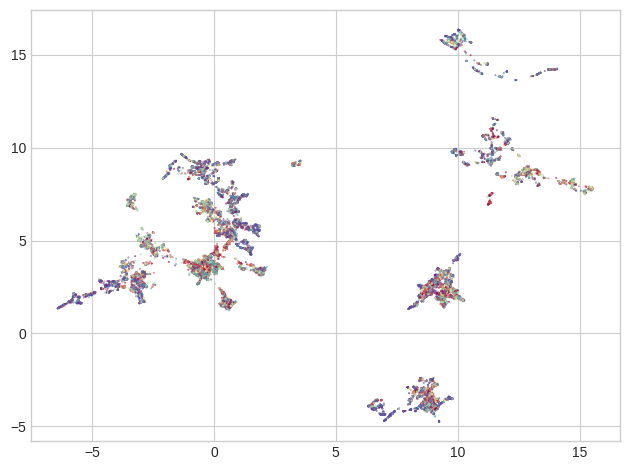

In [ ]:
plt.scatter(clusterable_embedding_3d[:, 0], clusterable_embedding_3d[:, 1],
            c=y_train, s=0.1, cmap='Spectral')

In [ ]:
labels_ensemble_3d = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500,
).fit_predict(clusterable_embedding_3d)

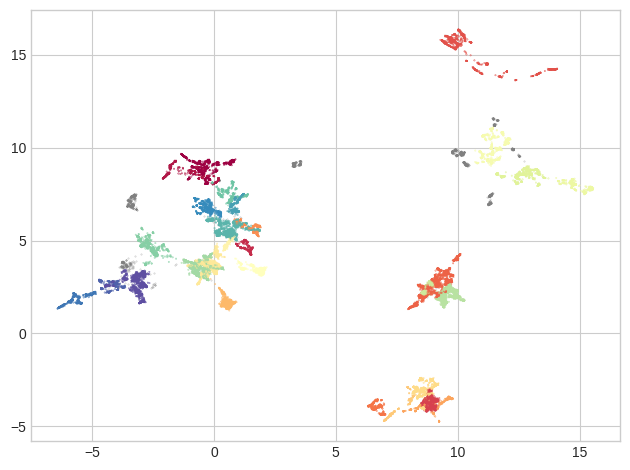

In [ ]:
clustered_ensemble_3d = (labels_ensemble_3d >= 0)
plt.scatter(clusterable_embedding_3d[~clustered_ensemble_3d, 0],
            clusterable_embedding_3d[~clustered_ensemble_3d, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(clusterable_embedding_3d[clustered_ensemble_3d, 0],
            clusterable_embedding_3d[clustered_ensemble_3d, 1],
            c=labels_ensemble_3d[clustered_ensemble_3d],
            s=0.1,
            cmap='Spectral');

In [ ]:
# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train, labels_ensemble_3d)
ami = adjusted_mutual_info_score(y_train, labels_ensemble_3d)

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): 0.01888268810538454
Adjusted Mutual Information (AMI) Score: 0.057223355235181614


### 8.5.3 Export embeddings

Export embeddings for 3-D visualisation in TensorBoard.

In [ ]:
# Save the 3D embedding to a TSV file
np.savetxt('pru_umap_3d_embedding_02.tsv', clusterable_embedding_3d, delimiter='\t')

In [ ]:
from google.colab import files

# Download the TSV data file
files.download('pru_umap_3d_embedding_02.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the labels from the subsequent HDBSCAN

# Define a color mapping for each of the 8 classes
color_map = {
    1: '#FF0000',  # Red
    2: '#00FF00',  # Green
    3: '#0000FF',  # Blue
    4: '#FFFF00',  # Yellow
    5: '#FF00FF',  # Magenta
    6: '#00FFFF',  # Cyan
    7: '#FFA500',  # Orange
    8: '#800080'   # Purple
}

# Create a metadata DataFrame
metadata = pd.DataFrame({
    'Label': y_train,
#    'Colour': [color_map[label] for label in labels_ensemble_3d],  # Map labels to colors
    'Colour2': labels_ensemble_3d
})

# Save the metadata to a TSV file without a header
metadata.to_csv('pru_umap_3d_metadata.tsv', sep='\t', header=True, index=False)


In [ ]:
files.download('pru_umap_3d_metadata.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import display
from IPython.display import HTML
import os

# uploaded = files.upload() manual upload by user
print(os.listdir('/content/drive/My Drive/ED5005_Project/video/'))

# List of MP3 file paths
file_path = ['/content/drive/My Drive/ED5005_Project/video/pru-3d-viz-02.mov']

# Display video player
video_html = f"""
<video width="640" height="480" controls>
  <source src="{file_path}" type="video/quicktime">
</video>
"""
display(HTML(video_html))

['pru-3d-viz-02.mov']


In [ ]:
clusterable_embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=8,
    random_state=42,
).fit_transform(X_train_L1reg)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


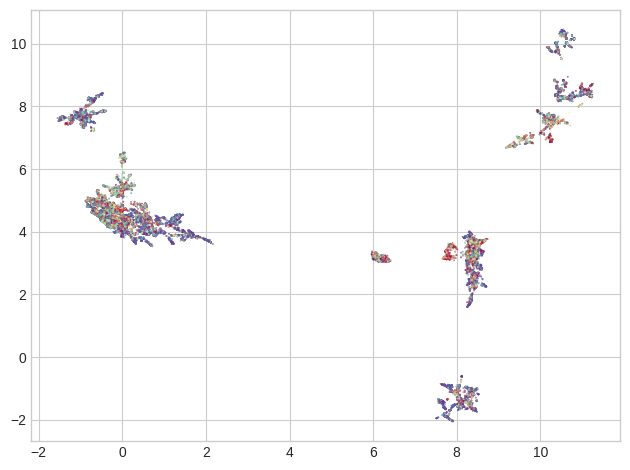

In [ ]:
plt.scatter(clusterable_embedding[:, 0], clusterable_embedding[:, 1],
            c=y_train, s=0.1, cmap='Spectral');

In [ ]:
clusterable_embedding_sampled = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=8,
    random_state=42,
).fit_transform(X_train_L1reg_sampled)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


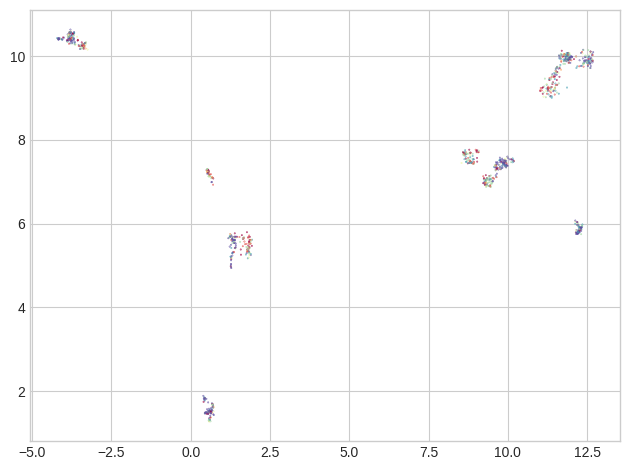

In [ ]:
plt.scatter(clusterable_embedding_sampled[:, 0], clusterable_embedding_sampled[:, 1],
            c=y_train_L1reg_sampled, s=0.1, cmap='Spectral')

In [ ]:
labels = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500,
).fit_predict(clusterable_embedding)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


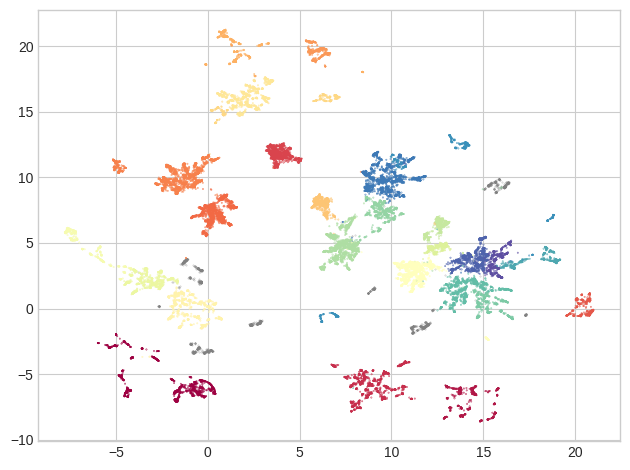

In [ ]:
clustered = (labels >= 0)
plt.scatter(standard_embedding[~clustered, 0],
            standard_embedding[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(standard_embedding[clustered, 0],
            standard_embedding[clustered, 1],
            c=labels[clustered],
            s=0.1,
            cmap='Spectral');

In [ ]:
labels_sampled = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500,
).fit_predict(clusterable_embedding_sampled)

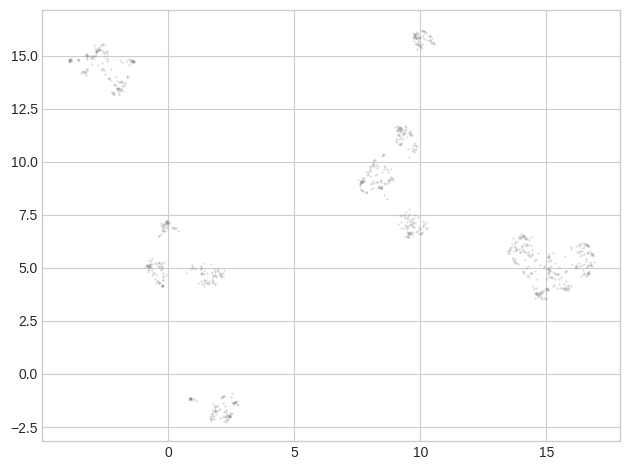

In [ ]:
clustered_sampled = (labels_sampled >= 0)
plt.scatter(standard_embedding_sampled[~clustered_sampled, 0],
            standard_embedding_sampled[~clustered_sampled, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(standard_embedding_sampled[clustered_sampled, 0],
            standard_embedding_sampled[clustered_sampled, 1],
            c=labels_sampled[clustered_sampled],
            s=0.1,
            cmap='Spectral');

In [ ]:
# Assuming y_train_L1reg contains the true labels and kmeans_labels contains the labels assigned by the clustering algorithm
ari = adjusted_rand_score(y_train, labels)
ami = adjusted_mutual_info_score(y_train, labels)

# Printing the results
print("Adjusted Rand Index (ARI):", ari)
print("Adjusted Mutual Information (AMI) Score:", ami)

Adjusted Rand Index (ARI): 0.019095619213787975
Adjusted Mutual Information (AMI) Score: 0.055665650560621664


In [ ]:
np.sum(clustered) / X_train_L1reg.shape[0]

0.9521163130122375

UMAP - 3D

In [ ]:
# Save the 3D embedding to a TSV file
np.savetxt('pru_umap_3d_embedding.tsv', clusterable_embedding, delimiter='\t')

In [ ]:
# Prepare metadata (for example, labels)
metadata = pd.DataFrame({'Label': y_train})

# Save the metadata to a TSV file
# metadata.to_csv('prudential_umap_metadata.tsv', sep='\t', index=False)


# Define a color mapping for each of the 8 classes
color_map = {
    1: '#FF0000',  # Red
    2: '#00FF00',  # Green
    3: '#0000FF',  # Blue
    4: '#FFFF00',  # Yellow
    5: '#FF00FF',  # Magenta
    6: '#00FFFF',  # Cyan
    7: '#FFA500',  # Orange
    8: '#800080'   # Purple
}

# Create a metadata DataFrame
metadata = pd.DataFrame({
    'Label': y_train,
    'Color': [color_map[label] for label in y_train]  # Map labels to colors
})

# Save the metadata to a TSV file without a header
metadata.to_csv('pru_umap_metadata.tsv', sep='\t', header=True, index=False)


In [ ]:
print(f"Number of embeddings: {clusterable_embedding.shape[0]}")
print(f"Number of metadata entries: {metadata.shape[0]}")

Number of embeddings: 35628
Number of metadata entries: 35628


In [ ]:
from google.colab import files

# Download the TSV file
files.download('pru_umap_3d_embedding.tsv')
files.download('pru_umap_metadata.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# References

* Montoya, A., BigJek14, Bull, denisedunleavy, egrad, FleetwoodHack, Imbayoh, PadraicS, Pru_Admin, tpitman, & Cukierski, W. (2015). Prudential Life Insurance Assessment. Kaggle. Retrieved from https://kaggle.com/competitions/prudential-life-insurance-assessment

* Sarpal, K. (2022). Machine Learning for Risk Classification - KS. Retrieved July 28, 2024, from https://kaggle.com/code/karansarpal/machine-learning-for-risk-classification-ks